# Import libraries

In [1]:
import imgaug

imgaug.__version__

'0.4.0'

In [2]:
from IPython.display import clear_output

In [3]:
!pip install --upgrade pip

!pip install gdown

!pip install pandas
!pip install numpy
!pip install scipy
!pip install matplotlib
!pip install opencv-python
!pip install seaborn
!pip install nibabel
!pip install imgaug
!pip install tqdm
!pip install scikit-learn

!python3 -m pip install tensorflow
!pip install keras
!pip install keras-segmentation
!pip install -U segmentation-models

clear_output()

In [3]:
import pandas as pd
import numpy as np
import scipy
import matplotlib.pyplot as plt
import seaborn
import cv2 as cv
import nibabel as nib
import pickle
import imgaug as ia
import imgaug.augmenters as iaa
import tqdm
import gc
import warnings

import gdown

import tensorflow as tf
from keras import backend as K
from keras import losses, metrics
from keras import optimizers
from keras import callbacks
from keras.models import Model
from keras.layers import Input, BatchNormalization, Activation, Dense, Dropout
from keras.layers import concatenate, Conv2D, MaxPooling2D, Conv2DTranspose
from keras.layers import Multiply
from sklearn.model_selection import train_test_split
import keras_segmentation as ks

warnings.filterwarnings('ignore')
%matplotlib inline
print("Version: ", tf.version.VERSION)
print("GPU is", "available" if tf.config.experimental.list_physical_devices("GPU") else "not available")

2023-03-29 13:56:15.951002: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F AVX512_VNNI FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-03-29 13:56:16.370511: I tensorflow/core/util/port.cc:104] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2023-03-29 13:56:30.444531: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /home/rparchiev/env/lib/python3.10/site-packages/cv2/../../lib64::/usr/local/lib:/usr/l

Version:  2.11.1
GPU is available


# Tensorflow GPU

In [4]:
!nvidia-smi

/bin/bash: /home/rparchiev/miniconda3/lib/libtinfo.so.6: no version information available (required by /bin/bash)
Wed Mar 29 13:56:56 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 515.43.04    Driver Version: 515.43.04    CUDA Version: 11.7     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  NVIDIA A100 80G...  On   | 00000000:31:00.0 Off |                    0 |
| N/A   43C    P0    48W / 300W |      2MiB / 81920MiB |      0%      Default |
|                               |                      |             Disabled |
+-------------------------------+---------------------

In [5]:
from tensorflow.python.client import device_lib 
 
def get_available_gpus(): 
    local_device_protos = device_lib.list_local_devices() 
    return [x.name for x in local_device_protos if x.device_type == 'GPU']

get_available_gpus()

2023-03-29 13:56:56.865588: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F AVX512_VNNI FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-03-29 13:56:59.704199: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1613] Created device /device:GPU:0 with 78971 MB memory:  -> device: 0, name: NVIDIA A100 80GB PCIe, pci bus id: 0000:31:00.0, compute capability: 8.0
2023-03-29 13:56:59.705733: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1613] Created device /device:GPU:1 with 78971 MB memory:  -> device: 1, name: NVIDIA A100 80GB PCIe, pci bus id: 0000:98:00.0, compute capability: 8.0


['/device:GPU:0', '/device:GPU:1']

# Data extraction

In [7]:
url = 'https://drive.google.com/file/d/1-UK0UCBc-XYTnl8wb8QezZMjn7IkgE9g/view?usp=share_link'
output_path = 'archive.zip'
gdown.download(url, output_path, quiet=False, fuzzy=True)

Downloading...
From: https://drive.google.com/uc?id=1-UK0UCBc-XYTnl8wb8QezZMjn7IkgE9g
To: /home/rparchiev/archive.zip
100%|██████████████████████████████████████| 1.11G/1.11G [00:26<00:00, 42.6MB/s]


'archive.zip'

In [8]:
!unzip archive.zip -d train_dataset

!rm -r archive.zip

clear_output()

In [9]:
url = 'https://drive.google.com/file/d/14zCo-090RD6m1dfhPGmrWSCD8UGI1MEz/view?usp=share_link'
output_path = 'chest_ct_segmentation.zip'
gdown.download(url, output_path, quiet=False, fuzzy=True)

Downloading...
From: https://drive.google.com/uc?id=14zCo-090RD6m1dfhPGmrWSCD8UGI1MEz
To: /home/rparchiev/chest_ct_segmentation.zip
100%|██████████████████████████████████████| 1.73G/1.73G [00:55<00:00, 31.1MB/s]


'chest_ct_segmentation.zip'

In [ ]:
!unzip chest_ct_segmentation.zip -d chest_ct_segmentation

!rm -r chest_ct_segmentation.zip

clear_output()

# Unet model

## [Unet](https://www.kaggle.com/code/samighazouani/task3-lung-mask-segmentation-with-u-net) model 4 - test 1

In [297]:
# Read and examine metadata
metadata = pd.read_csv('train_dataset/metadata.csv')
metadata.replace('../input/covid19-ct-scans/', 'train_dataset/', regex=True, inplace=True)
metadata.sample(3)

,ct_scan,lung_mask,infection_mask,lung_and_infection_mask
17,train_dataset/ct_scans/radiopaedia_org_covid-1...,train_dataset/lung_mask/radiopaedia_40_86625_0...,train_dataset/infection_mask/radiopaedia_40_86...,train_dataset/lung_and_infection_mask/radiopae...
5,train_dataset/ct_scans/coronacases_org_006.nii,train_dataset/lung_mask/coronacases_006.nii,train_dataset/infection_mask/coronacases_006.nii,train_dataset/lung_and_infection_mask/coronaca...
9,train_dataset/ct_scans/coronacases_org_010.nii,train_dataset/lung_mask/coronacases_010.nii,train_dataset/infection_mask/coronacases_010.nii,train_dataset/lung_and_infection_mask/coronaca...


In [298]:
# img_size is the preferred image size to which the image is to be resized
img_size = 512

## Data processing

In [299]:
clahe = cv.createCLAHE(clipLimit=3.0)

def clahe_enhancer(img, clahe, axes):
    '''Contract Limited Adaptive Histogram Equalizer'''
    img = np.uint8(img*255)
    clahe_img = clahe.apply(img)

    if len(axes) > 0 :
        axes[0].imshow(img, cmap='bone')
        axes[0].set_title("Original CT scan")
        axes[0].set_xticks([]); axes[0].set_yticks([])

        axes[1].imshow(clahe_img, cmap='bone')
        axes[1].set_title("CLAHE Enhanced CT scan")
        axes[1].set_xticks([]); axes[1].set_yticks([])

        if len(axes) > 2 :
            axes[2].hist(img.flatten(), alpha=0.4, label='Original CT scan')
            axes[2].hist(clahe_img.flatten(), alpha=0.4, label="CLAHE Enhanced CT scan")
            plt.legend()

    return(clahe_img)

Number of slices:  301


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


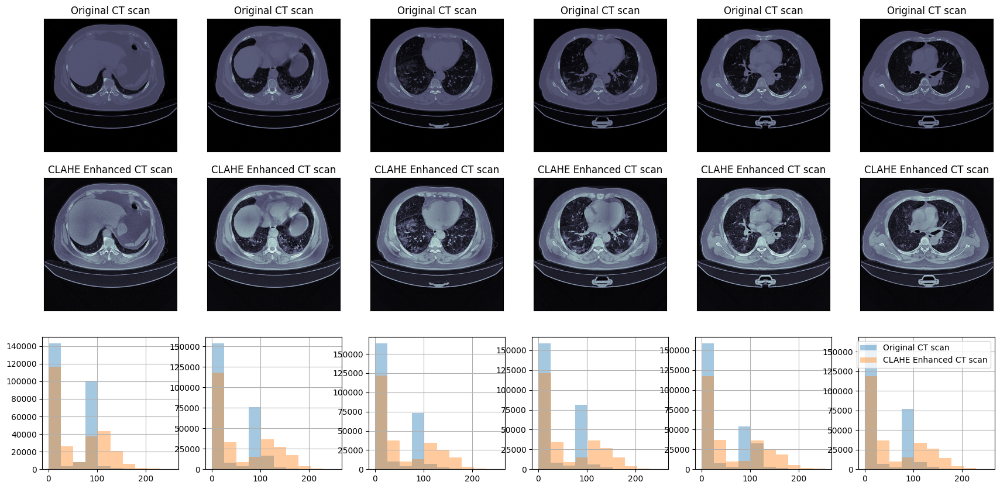

In [300]:
cts = nib.load(metadata.loc[0, 'ct_scan'])
slices = cts.shape[2]
print('Number of slices: ', slices)

arr = cts.get_fdata()
arr = np.rot90(np.array(arr))
arr = arr[:,:,range(80,200,20)]
arr = np.reshape(np.rollaxis(arr, 2),(arr.shape[2],arr.shape[0],arr.shape[1], 1))

fig, axes = plt.subplots(3, 6, figsize=(21,10))

for ii in range(arr.shape[0]):
    img = cv.resize(arr[ii], dsize=(img_size, img_size), interpolation=cv.INTER_AREA)
    xmax, xmin = img.max(), img.min()
    img = (img - xmin)/(xmax - xmin)
    clahe_img = clahe_enhancer(img, clahe, list(axes[:, ii]))

In [301]:
def get_contours(img):
    img = np.uint8(img*255)

    kernel = np.ones((3,3),np.float32)/9
    img = cv.filter2D(img, -1, kernel)

    ret, thresh = cv.threshold(img, 50, 255, cv.THRESH_BINARY)
    contours, hierarchy = cv.findContours(thresh, 2, 1)
    #Areas = [cv.contourArea(cc) for cc in contours]; print(Areas)

    # filter contours that are too large or small
    size = get_size(img)
    contours = [cc for cc in contours if contourOK(cc, size)]
    return contours

def get_size(img):
    ih, iw = img.shape
    return iw * ih

def contourOK(cc, size):
    x, y, w, h = cv.boundingRect(cc)
    if ((w < 50 and h > 150) or (w > 150 and h < 50)) :
        return False # too narrow or wide is bad
    area = cv.contourArea(cc)
    return area < (size * 0.5) and area > 200

def find_boundaries(img, contours):
    # margin is the minimum distance from the edges of the image, as a fraction
    ih, iw = img.shape
    minx = iw
    miny = ih
    maxx = 0
    maxy = 0

    for cc in contours:
        x, y, w, h = cv.boundingRect(cc)
        if x < minx: minx = x
        if y < miny: miny = y
        if x + w > maxx: maxx = x + w
        if y + h > maxy: maxy = y + h

    return (minx, miny, maxx, maxy)

def crop_(img, boundaries):
    minx, miny, maxx, maxy = boundaries
    return img[miny:maxy, minx:maxx]

def crop_img(img, axes) :
    contours = get_contours(img)
    #plt.figure() # uncomment to troubleshoot
    #canvas = np.zeros_like(img)
    #cv.drawContours(canvas , contours, -1, (255, 255, 0), 1)
    #plt.imshow(canvas)
    bounds = find_boundaries(img, contours)
    cropped_img = crop_(img, bounds)

    if len(axes) > 0 :
        axes[0].imshow(img, cmap='bone')
        axes[0].set_title("Original CT scan")
        axes[0].set_xticks([]); axes[0].set_yticks([])

        axes[1].imshow(cropped_img, cmap='bone')
        axes[1].set_title("Cropped CT scan")
        axes[1].set_xticks([]); axes[1].set_yticks([])

    return cropped_img, bounds

Number of slices:  301


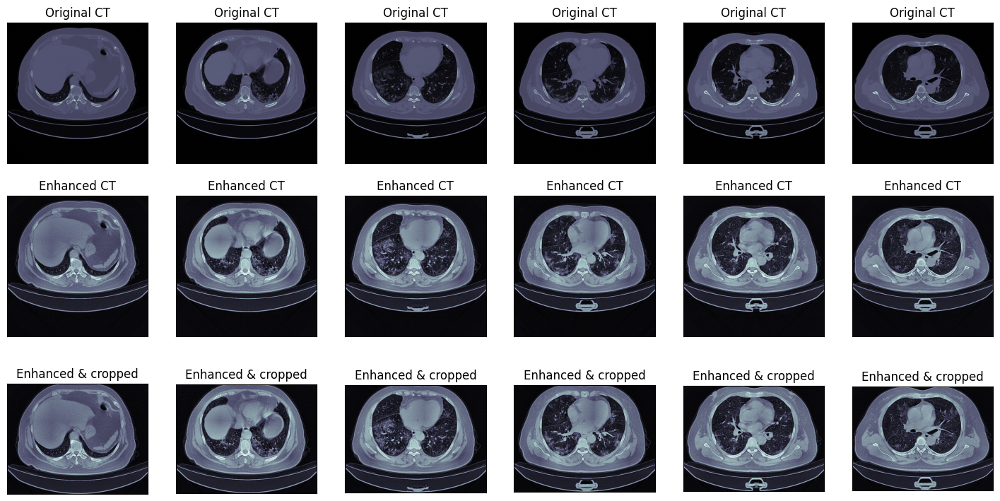

In [302]:
cts = nib.load(metadata.loc[0, 'ct_scan'])
slices = cts.shape[2]
print('Number of slices: ', slices)

arr = cts.get_fdata()
arr = np.rot90(np.array(arr))
arr = arr[:,:,range(80,200,20)]
arr = np.reshape(np.rollaxis(arr, 2),(arr.shape[2],arr.shape[0],arr.shape[1], 1))

fig, axes = plt.subplots(3, 6, figsize=(18,9))

for ii in range(arr.shape[0]):
    img = cv.resize(arr[ii], dsize=(img_size, img_size), interpolation=cv.INTER_AREA)
    xmax, xmin = img.max(), img.min()
    img = (img - xmin)/(xmax - xmin)
    _, bounds = crop_img(img, [])
    axes[0,ii].imshow(img, cmap='bone')
    axes[0,ii].set_title('Original CT')
    axes[0,ii].set_xticks([]); axes[0,ii].set_yticks([])

    clahe_img = clahe_enhancer(img, clahe, [])
    axes[1,ii].imshow(clahe_img, cmap='bone')
    axes[1,ii].set_title('Enhanced CT')
    axes[1,ii].set_xticks([]); axes[1,ii].set_yticks([])

    cropped_img = crop_(clahe_img, bounds)
    axes[2,ii].imshow(cropped_img, cmap='bone')
    axes[2,ii].set_title('Enhanced & cropped')
    axes[2,ii].set_xticks([]); axes[2,ii].set_yticks([])

In [303]:
!cd chest_ct_segmentation/ && ls

/bin/bash: /home/rparchiev/miniconda3/lib/libtinfo.so.6: no version information available (required by /bin/bash)
augmented_cts.cp  masks		       pretrained_model
images		  preprocessed_cts.cp  train.csv


In [354]:
df_2 = pd.read_csv('chest_ct_segmentation/train.csv')
print(df_2.shape)
df_2 = df_2.iloc[:100]
df_2

In [355]:
df_2.ImageId[0]

In [356]:
cts = nib.load(metadata.loc[0, 'ct_scan'])
lungs = nib.load(metadata.loc[0, 'lung_mask'])
#infec = nib.load(metadata.loc[0, 'infection_mask'])
slices = cts.shape[2]

arr_cts = cts.get_fdata()
arr_lungs = lungs.get_fdata()
#arr_infec = infec.get_fdata()

arr_cts = np.rot90(np.array(arr_cts))
arr_lungs = np.rot90(np.array(arr_lungs))
#arr_infec = np.rot90(np.array(arr_infec))

# arr_cts = arr_cts[:, :, range(80,200,20)]
# arr_lungs = arr_lungs[:, :, range(80,200,20)]
#arr_infec = arr_infec[:, :, range(80,200,20)]

arr_cts = np.reshape(np.rollaxis(arr_cts, 2),
                     (arr_cts.shape[2],arr_cts.shape[0],arr_cts.shape[1], 1))
arr_lungs = np.reshape(np.rollaxis(arr_lungs, 2),
                     (arr_lungs.shape[2],arr_lungs.shape[0],arr_lungs.shape[1], 1))
#arr_infec = np.reshape(np.rollaxis(arr_infec, 2),
                    # (arr_infec.shape[2],arr_infec.shape[0],arr_infec.shape[1], 1))
print(arr_cts[0].shape)

In [357]:
def clean_mask(masks: np.array, plot_mask: bool = False) -> np.array:
    """ Deleting tracheas and hurts from masks. 
        Resulting mask have only lungs non zero pixels. """

    lung_only_mask = masks

    # print(len(np.unique(lung_only_mask)), '-', np.unique(lung_only_mask))

    # Thresholding values for heart and trachea
    heart_trachea_threshold = (40, 255) 
    new_mask = np.where(  (lung_only_mask >= heart_trachea_threshold[0]) 
                        & (lung_only_mask <= heart_trachea_threshold[1]), 
                        0, lung_only_mask)

    # print(len(np.unique(new_mask)), '-', np.unique(new_mask))
    kernel_size = (6, 6)
    if np.max(np.unique(new_mask)) < 80:
        kernel_size = (4,4)

    # Define the structuring element for erosion and dilation
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, kernel_size)

    # Apply erosion to remove small lines
    eroded_mask = cv2.erode(new_mask.astype(np.uint8), kernel)

    # Apply dilation to fill in small holes
    dilated_mask = cv2.dilate(eroded_mask, kernel)
    # print(np.unique(dilated_mask))

    if plot_mask:
        fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(10, 5))

        # Show the original image on the left
        ax[0].imshow(lung_only_mask, cmap="gray")
        ax[0].set_title("Original Image")

        # Show the processed mask on the right
        ax[1].imshow(dilated_mask, cmap="gray")
        ax[1].set_title("Processed Mask")

        # Show the plot
        plt.show()

    return dilated_mask

In [358]:
from typing import Tuple

def shuffle_arrays(arr1: np.array, arr2: np.array) -> Tuple[np.array, np.array]:
    """ Returns the same random permutation for 2 numpy arrays """
    assert arr1.shape == arr2.shape, f"Arrays {arr1} and {arr2} must be the same size"
    
    num_images = len(arr1)
    permutation = np.random.permutation(num_images)

    shuffled_images = arr1[permutation]
    shuffled_masks = arr2[permutation]   
    
    return shuffled_images, shuffled_masks


def enchance_and_crop(unprocessed_image: np.array, 
                      unprocessed_mask: np.array,
                      ct: bool = True) -> np.array:
    """ Cropping every image and enchansing CT scan """
    img_lungs = cv.resize(unprocessed_mask, dsize=(img_size, img_size),interpolation=cv.INTER_AREA)
    xmax, xmin = img_lungs.max(), img_lungs.min()
    img_lungs = (img_lungs - xmin)/(xmax - xmin)
    cropped_lungs, bounds = crop_img(img_lungs, [])

    lungs_all.append(cropped_lungs)
    img_ct = cv.resize(unprocessed_image, dsize=(img_size, img_size),interpolation=cv.INTER_AREA)
    xmax, xmin = img_ct.max(), img_ct.min()
    img_ct = (img_ct - xmin)/(xmax - xmin)
    clahe_ct = clahe_enhancer(img_ct, clahe, [])
    cropped_ct = crop_(clahe_ct, bounds)
    cts_all.append(cropped_ct)    
    
    return cts_all, lungs_all, 

In [359]:
from PIL import Image

imgs_ = []
masks_ = []
img_resize = (512, 512, 1)
heart_trachea_threshold = (70, 81) 

PATH_TO_IMGS = 'chest_ct_segmentation/images/images/'
PATH_TO_MASKS = 'chest_ct_segmentation/masks/masks/'

for path in range(df_2.shape[0]):  
    # Preprocess the image and mask data
    img = Image.open(PATH_TO_IMGS+df_2.ImageId[path])
    img = img.convert('L')  # convert to grayscale
    # img = img.resize((img_size, img_size), Image.LANCZOS)
    img = np.array(img)
    img = np.expand_dims(img, axis=-1)  # add channel dimension

    msk = Image.open(PATH_TO_MASKS+df_2.MaskId[path])
    msk = msk.convert('L')  # convert to grayscale
    # msk = msk.resize((img_size, img_size), Image.LANCZOS)
    msk = np.array(msk)
    msk = clean_mask(msk)
    msk = np.expand_dims(msk, axis=-1)  # add channel dimension
    
    img, msk = enchance_and_crop(img, msk)
    imgs_.append(img)
    masks_.append(msk)

In [360]:
print(len(imgs_))
assert len(imgs_) == len(masks_)

In [361]:
masks_[0].shape

In [362]:
arr_lungs[0].shape

In [345]:
# # Concatenate the image arrays
# all_imgs = np.concatenate((imgs_, arr_cts), axis=0)

# # Concatenate the mask arrays
# all_masks = np.concatenate((masks_, arr_lungs), axis=0)

In [363]:
# fig, axes = plt.subplots(2, 6, figsize=(18,6))

# for ii in range(6):
#     img_ct = cv.resize(all_imgs[ii], dsize=(img_size, img_size), interpolation=cv.INTER_AREA)
#     img_lungs = cv.resize(all_masks[ii], dsize=(img_size, img_size), interpolation=cv.INTER_AREA)
#     # img_infec = cv.resize(arr_infec[ii], dsize=(img_size, img_size), interpolation=cv.INTER_AREA)

#     xmax, xmin = img_lungs.max(), img_lungs.min()
#     img_lungs = (img_lungs - xmin)/(xmax - xmin)
#     cropped_lungs, bounds = crop_img(img_lungs, [])

#     xmax, xmin = img_ct.max(), img_ct.min()
#     img_ct = (img_ct - xmin)/(xmax - xmin)
#     clahe_ct = clahe_enhancer(img_ct, clahe, [])
#     cropped_ct = crop_(clahe_ct, bounds)
#     #cropped_infec = crop_(img_infec, bounds)

#     axes[0,ii].imshow(cropped_ct, cmap='bone')
#     axes[0,ii].set_title("CT scan")
#     axes[0,ii].set_xticks([]); axes[0,ii].set_yticks([])

#     axes[1,ii].imshow(cropped_lungs, cmap='Greens')
#     axes[1,ii].set_title("Lungs mask")
#     axes[1,ii].set_xticks([]); axes[1,ii].set_yticks([])

#     #axes[2,ii].imshow(cropped_infec, cmap='Reds')
#     #axes[2,ii].set_title("Infection mask")
#     #axes[2,ii].set_xticks([]); axes[2,ii].set_yticks([])

In [370]:
print(1)

### check

In [368]:
metadata.shape[0]

In [366]:
metadata.shape[0] + len(imgs_)

In [349]:
cts_all = []
lungs_all = []
max_w, max_h = 0, 0 # max width and height

for fnum in tqdm.tqdm(range(metadata.shape[0]//2)): # + len(imgs_))):
    cts = nib.load(metadata.loc[fnum, 'ct_scan'])
    lungs = nib.load(metadata.loc[fnum, 'lung_mask'])

    slices = cts.shape[2]

    arr_cts = cts.get_fdata()
    arr_lungs = lungs.get_fdata()

    arr_cts = np.rot90(np.array(arr_cts))
    arr_lungs = np.rot90(np.array(arr_lungs))

    arr_cts = arr_cts[:, :, round(slices*0.2):round(slices*0.8)]
    arr_lungs = arr_lungs[:, :, round(slices*0.2):round(slices*0.8)]
    
    arr_cts = np.reshape(np.rollaxis(arr_cts, 2),
                     (arr_cts.shape[2],arr_cts.shape[0],arr_cts.shape[1], 1))
    arr_lungs = np.reshape(np.rollaxis(arr_lungs, 2),
                     (arr_lungs.shape[2],arr_lungs.shape[0],arr_lungs.shape[1], 1))

    for ii in range(arr_cts.shape[0]):
        lung, mask = enchance_and_crop(all_imgs[ii], all_masks[ii])
        lungs_all.append(mask)
        cts_all.append(lung)

100%|██████████████████████████████████████████| 10/10 [20:41<00:00, 124.12s/it]


In [ ]:
# Concatenate the image arrays
all_imgs = np.concatenate((imgs_, arr_cts), axis=0)

# Concatenate the mask arrays
all_masks = np.concatenate((masks_, arr_lungs), axis=0)
    
# shuffling both arrays
all_imgs, all_masks = shuffle_arrays(all_imgs, all_masks)

In [350]:
# 2112
print(len(cts_all))

168629


In [351]:
num_pix = 100 # NEW SIZE
del_lst = []
for ii in tqdm.tqdm(range(len(cts_all))) :
    try :
        cts_all[ii] = cv.resize(cts_all[ii], dsize=(num_pix, num_pix), interpolation=cv.INTER_AREA)
        cts_all[ii] = np.reshape(cts_all[ii], (num_pix, num_pix, 1))

        lungs_all[ii] = cv.resize(lungs_all[ii], dsize=(num_pix, num_pix), interpolation=cv.INTER_AREA)
        lungs_all[ii] = np.reshape(lungs_all[ii], (num_pix, num_pix, 1))

        #infects_all[ii] = cv.resize(infects_all[ii], dsize=(num_pix, num_pix), interpolation=cv.INTER_AREA)
        #infects_all[ii] = np.reshape(infects_all[ii], (num_pix, num_pix, 1))
    except :
        del_lst.append(ii)

for idx in del_lst[::-1] :
    del cts_all[idx]
    del lungs_all[idx]
    #del infects_all[idx]

 95%|███████████████████████████████▍ | 160424/168629 [01:19<00:03, 2717.81it/s]

In [352]:
fig, axes = plt.subplots(1, 2, figsize=(9,3))

axes[0].imshow(cts_all[-30][:, :, 0])
axes[0].set_title("Enhanced & Cropped CT")

axes[1].imshow(lungs_all[-30][:, :, 0], cmap='Greens')
axes[1].set_title("Lungs")

#axes[2].imshow(infects_all[250][:, :, 0], cmap='Reds')
#axes[2].set_title("Infection");

In [353]:
with open('chest_ct_segmentation/preprocessed_cts.cp', 'wb') as myfile:
    pickle.dump({'cts_all': cts_all, 'lungs_all': lungs_all}, myfile)

In [ ]:
lung_bool = np.ones((1, len(lungs_all)))
for ii in range(len(lungs_all)):
    if np.unique(lungs_all[ii]).size == 1:
        lung_bool[0, ii] = 0

print("Number of CTs with no lung mask: %d" %(len(lungs_all)-lung_bool.sum()))

# for index in sorted(no_masks, reverse = True):
#    del infections[index]
#    del cts[index]

## ошибка тут <----

In [ ]:
ia.seed(1)

seq = iaa.Sequential([
    iaa.Fliplr(0.5), # horizontal flips
    iaa.Flipud(0.5), # vertical flips

    # Apply affine transformations to each image.
    # Scale/zoom them, translate/move them, rotate them and shear them.
    iaa.Affine(
        scale={"x": (0.8, 1.2), "y": (0.8, 1.2)}, # scale images
        translate_percent={"x": (-0.2, 0.2), "y": (-0.2, 0.2)},
        rotate=(-7, 7),
        shear=(-3, 3)
    )
], random_order=True) # apply augmenters in random order

In [ ]:
num_augs = round(len(cts_all)/3.)
rand_idx = np.random.randint(0, len(cts_all), size=num_augs)

sample_cts = [cts_all[ii] for ii in rand_idx]
sample_lungs = [lungs_all[ii] for ii in rand_idx]
#sample_infects = [infects_all[ii] for ii in rand_idx]

In [ ]:
seq_det = seq.to_deterministic()
cts_aug = seq_det.augment_images(sample_cts)
lungs_aug = seq_det.augment_images(sample_lungs)
#infects_aug = seq_det.augment_images(sample_infects)

In [ ]:
fig, axes = plt.subplots(2, 5, figsize=(15,9))

for ii in range(5) :
    axes[0, ii].imshow(cts_aug[ii*10+50][:, :, 0])
    axes[0, ii].set_title("Enhanced & Cropped CT")

    axes[1, ii].imshow(lungs_aug[ii*10+50][:, :, 0], cmap='Greens')
    axes[1, ii].set_title("Lungs")

    #axes[2, ii].imshow(infects_aug[ii*10+50][:, :, 0], cmap='Reds')
    #axes[2, ii].set_title("Infection");

In [ ]:
cts_all = tf.convert_to_tensor(cts_all)
cts_aug = tf.convert_to_tensor(cts_aug)
lungs_all = tf.convert_to_tensor(lungs_all)
lungs_aug = tf.convert_to_tensor(lungs_aug)
#infects_all = tf.convert_to_tensor(infects_all)
#infects_aug = tf.convert_to_tensor(infects_aug)

cts = tf.concat([cts_all, cts_aug], axis=0)
lungs = tf.concat([lungs_all, lungs_aug], axis=0)
#infects = tf.concat([infects_all, infects_aug], axis=0)

In [ ]:
indices = tf.range(start=0, limit=cts.shape[0], dtype=tf.int32)
shuffled_indices = tf.random.shuffle(indices)

cts = tf.gather(cts, shuffled_indices)
lungs = tf.gather(lungs, shuffled_indices)
#infects = tf.gather(infects, shuffled_indices)

print(cts.shape, lungs.shape)

In [ ]:
with open('chest_ct_segmentation/augmented_cts.cp', 'wb') as myfile:
    pickle.dump({'cts': cts, 'lungs': lungs}, myfile)

## Loss functions

In [ ]:
## see https://github.com/keras-team/keras/issues/9395

def dice_coeff(y_true, y_pred, smooth=1):
    intersection = K.sum(y_true * y_pred, axis=[1,2,3])
    union = K.sum(y_true, axis=[1,2,3]) + K.sum(y_pred, axis=[1,2,3])
    dice = K.mean((2. * intersection + smooth)/(union + smooth), axis=0)
    return dice

def dice_loss(y_true, y_pred):
    loss = 1 - dice_coeff(y_true, y_pred)
    return loss

def bce_dice_loss(y_true, y_pred): #Binary Cross-Entropy
    loss = 0.5*losses.binary_crossentropy(y_true, y_pred) + 0.5*dice_loss(y_true, y_pred)
    return loss

def tversky_loss(y_true, y_pred):
    alpha, beta  = 0.5, 0.5

    ones = K.ones(K.shape(y_true))
    p0 = y_pred
    p1 = ones-y_pred
    g0 = y_true
    g1 = ones-y_true

    num = K.sum(p0*g0, (0,1,2))
    den = num + alpha*K.sum(p0*g1,(0,1,2)) + beta*K.sum(p1*g0,(0,1,2))

    T = K.sum(num/den)

    Ncl = K.cast(K.shape(y_true)[-1], 'float32')
    return Ncl-T

def weighted_bce_loss(y_true, y_pred, weight):
    epsilon = 1e-7
    y_pred = K.clip(y_pred, epsilon, 1. - epsilon)
    logit_y_pred = K.log(y_pred / (1. - y_pred))
    loss = weight * (logit_y_pred * (1. - y_true) +
                     K.log(1. + K.exp(-K.abs(logit_y_pred))) +
                     K.maximum(-logit_y_pred, 0.))
    return K.sum(loss) / K.sum(weight)

def weighted_dice_loss(y_true, y_pred, weight):
    smooth = 1.
    w, m1, m2 = weight, y_true, y_pred
    intersection = (m1*m2)
    score = (2.*K.sum(w*intersection) + smooth) / (K.sum(w*m1) + K.sum(w*m2) + smooth)
    loss = 1. - K.sum(score)
    return loss

def weighted_bce_dice_loss(y_true, y_pred):
    y_true = K.cast(y_true, 'float32')
    y_pred = K.cast(y_pred, 'float32')
    averaged_mask = K.pool2d(y_true, pool_size=(50, 50), strides=(1, 1),
                             padding='same', pool_mode='avg')
    weight = K.ones_like(averaged_mask)
    w0 = K.sum(weight)
    weight = 5. * K.exp(-5.*K.abs(averaged_mask - 0.5))
    w1 = K.sum(weight)
    weight *= (w0 / w1)
    loss = 0.5*weighted_bce_loss(y_true, y_pred, weight) + 0.5*dice_loss(y_true, y_pred)
    return loss

## Building model

In [ ]:
# define custom learning rate schedule
class CosineAnnealingLearningRateSchedule(callbacks.Callback):
    # constructor
    def __init__(self, n_epochs, n_cycles, lrate_max, verbose=0):
        self.epochs = n_epochs
        self.cycles = n_cycles
        self.lr_max = lrate_max
        self.lrates = list()

    # calculate learning rate for an epoch
    def cosine_annealing(self, epoch, n_epochs, n_cycles, lrate_max):
        epochs_per_cycle = np.floor(n_epochs/n_cycles)
        cos_inner = (np.pi * (epoch % epochs_per_cycle)) / (epochs_per_cycle)
        return lrate_max/2 * (np.cos(cos_inner) + 1)

    # calculate and set learning rate at the start of the epoch
    def on_epoch_begin(self, epoch, logs=None):
        # calculate learning rate
        lr = self.cosine_annealing(epoch, self.epochs, self.cycles, self.lr_max)
        # set learning rate
        K.set_value(self.model.optimizer.lr, lr)
        # log value
        self.lrates.append(lr)

In [ ]:
# define learning rate callback
n_epochs = 300
lrmax = 0.002
n_cycles = n_epochs / 25
lr_cb = CosineAnnealingLearningRateSchedule(n_epochs, n_cycles, lrmax)

In [ ]:
def cts_block_1 (x_in, conv2Dfilters, maxpool2Dsize=(2,2)) :
    x = Conv2D(conv2Dfilters, (3,3), activation='relu', padding='same',
               kernel_initializer="he_normal") (x_in)
    x = Conv2D(conv2Dfilters, (3, 3), activation='relu', padding='same',
               kernel_initializer="he_normal") (x)
    x_inter = BatchNormalization() (x)
    x = MaxPooling2D(maxpool2Dsize) (x_inter)
    x = Dropout(0.25)(x)

    return x, x_inter

def cts_block_2 (x_in, conv2Dfilters) :
    x = BatchNormalization() (x_in)
    x = Conv2D(conv2Dfilters, (3, 3), activation='relu', padding='same',
               kernel_initializer="he_normal") (x)
    x = Conv2D(conv2Dfilters, (3, 3), activation='relu', padding='same',
               kernel_initializer="he_normal") (x)

    return x

In [ ]:
def cts_model (input_shape) :

    x_input = Input(input_shape)

    ##################################  LUNG SEGMENTATION  ######################
    x, x1 = cts_block_1 (x_input, 32, maxpool2Dsize=(2,2)) #x: 50x50
    x, x2 = cts_block_1 (x, 64, maxpool2Dsize=(2,2)) #x: 25x25
    x, _ = cts_block_1 (x, 128, maxpool2Dsize=(1,1)) #x: 25x25
    x, _ = cts_block_1 (x, 256, maxpool2Dsize=(1,1)) #x: 25x25

    x = cts_block_2 (x, 256) #x: 25x25

    x = Conv2DTranspose(128, (2, 2), strides=(2,2), padding='same') (x) #x: 50x50
    x = cts_block_2 (x, 128) #x: 50x50

    x = Conv2DTranspose(64, (2, 2), padding='same') (x) #x: 50x50
    x = concatenate([x, x2]) #x: 50x50
    x = cts_block_2 (x, 64) #x: 50x50

    x = Conv2DTranspose(32, (2, 2), strides=(2,2), padding='same') (x) #x: 100x100
    x = concatenate([x, x1], axis=3) #x: 100x100
    x = cts_block_2 (x, 32) #x: 100x100

    lung_seg = Conv2D(1, (1, 1), activation='sigmoid', name='lung_output') (x) #x: 100x100

    model = Model(inputs=x_input, outputs=[lung_seg], name='cts_model')

    return model

In [44]:
from tensorflow.keras.layers import Lambda

IMG_WIDTH       = 512
IMG_HEIGHT      = 512
IMG_CHANNELS    = 1

# tf.keras.backend.clear_session()
nb_filter = [32, 64, 128, 256, 512]

# Build U-Net++ model
inputs = Input(cts.shape[1:]) # Input((IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS))
s = Lambda(lambda x: x / 255) (inputs)


c1 = Conv2D(32, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (s)
c1 = Dropout(0.5) (c1)
c1 = Conv2D(32, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (c1)
c1 = Dropout(0.5) (c1)
p1 = MaxPooling2D((2, 2), strides=(2, 2)) (c1)

c2 = Conv2D(64, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (p1)
c2 = Dropout(0.5) (c2)
c2 = Conv2D(64, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (c2)
c2 = Dropout(0.5) (c2)
p2 = MaxPooling2D((2, 2), strides=(2, 2)) (c2)

up1_2 = Conv2DTranspose(nb_filter[0], (2, 2), strides=(2, 2), name='up12', padding='same')(c2)
conv1_2 = concatenate([up1_2, c1], name='merge12', axis=3)
c3 = Conv2D(32, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (conv1_2)
c3 = Dropout(0.5) (c3)
c3 = Conv2D(32, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (c3)
c3 = Dropout(0.5) (c3)

conv3_1 = Conv2D(128, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (p2)
conv3_1 = Dropout(0.5) (conv3_1)
conv3_1 = Conv2D(128, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (conv3_1)
conv3_1 = Dropout(0.5) (conv3_1)
pool3 = MaxPooling2D((2, 2), strides=(2, 2), name='pool3')(conv3_1)

up2_2 = Conv2DTranspose(nb_filter[1], (2, 2), strides=(2, 2), name='up22', padding='same')(conv3_1)
conv2_2 = concatenate([up2_2, c2], name='merge22', axis=3) #x10
conv2_2 = Conv2D(64, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (conv2_2)
conv2_2 = Dropout(0.5) (conv2_2)
conv2_2 = Conv2D(64, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (conv2_2)
conv2_2 = Dropout(0.5) (conv2_2)

up1_3 = Conv2DTranspose(nb_filter[0], (2, 2), strides=(2, 2), name='up13', padding='same')(conv2_2)
conv1_3 = concatenate([up1_3, c1, c3], name='merge13', axis=3)
conv1_3 = Conv2D(32, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (conv1_3)
conv1_3 = Dropout(0.5) (conv1_3)
conv1_3 = Conv2D(32, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (conv1_3)
conv1_3 = Dropout(0.5) (conv1_3)

conv4_1 = Conv2D(256, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (pool3)
conv4_1 = Dropout(0.5) (conv4_1)
conv4_1 = Conv2D(256, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (conv4_1)
conv4_1 = Dropout(0.5) (conv4_1)
pool4 = MaxPooling2D((2, 2), strides=(2, 2), name='pool4')(conv4_1)

up3_2 = Conv2DTranspose(nb_filter[2], (2, 2), strides=(2, 2), name='up32', padding='same')(conv4_1)
conv3_2 = concatenate([up3_2, conv3_1], name='merge32', axis=3) #x20
conv3_2 = Conv2D(128, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (conv3_2)
conv3_2 = Dropout(0.5) (conv3_2)
conv3_2 = Conv2D(128, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (conv3_2)
conv3_2 = Dropout(0.5) (conv3_2)

up2_3 = Conv2DTranspose(nb_filter[1], (2, 2), strides=(2, 2), name='up23', padding='same')(conv3_2)
conv2_3 = concatenate([up2_3, c2, conv2_2], name='merge23', axis=3)
conv2_3 = Conv2D(64, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (conv2_3)
conv2_3 = Dropout(0.5) (conv2_3)
conv2_3 = Conv2D(64, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (conv2_3)
conv2_3 = Dropout(0.5) (conv2_3)

up1_4 = Conv2DTranspose(nb_filter[0], (2, 2), strides=(2, 2), name='up14', padding='same')(conv2_3)
conv1_4 = concatenate([up1_4, c1, c3, conv1_3], name='merge14', axis=3)
conv1_4 = Conv2D(32, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (conv1_4)
conv1_4 = Dropout(0.5) (conv1_4)
conv1_4 = Conv2D(32, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (conv1_4)
conv1_4 = Dropout(0.5) (conv1_4)

conv5_1 = Conv2D(512, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (pool4)
conv5_1 = Dropout(0.5) (conv5_1)
conv5_1 = Conv2D(512, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (conv5_1)
conv5_1 = Dropout(0.5) (conv5_1)

up4_2 = Conv2DTranspose(nb_filter[3], (2, 2), strides=(2, 2), name='up42', padding='same')(conv5_1)
conv4_2 = concatenate([up4_2, conv4_1], name='merge42', axis=3) #x30
conv4_2 = Conv2D(256, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (conv4_2)
conv4_2 = Dropout(0.5) (conv4_2)
conv4_2 = Conv2D(256, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (conv4_2)
conv4_2 = Dropout(0.5) (conv4_2)

up3_3 = Conv2DTranspose(nb_filter[2], (2, 2), strides=(2, 2), name='up33', padding='same')(conv4_2)
conv3_3 = concatenate([up3_3, conv3_1, conv3_2], name='merge33', axis=3)
conv3_3 = Conv2D(128, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (conv3_3)
conv3_3 = Dropout(0.5) (conv3_3)
conv3_3 = Conv2D(128, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (conv3_3)
conv3_3 = Dropout(0.5) (conv3_3)

up2_4 = Conv2DTranspose(nb_filter[1], (2, 2), strides=(2, 2), name='up24', padding='same')(conv3_3)
conv2_4 = concatenate([up2_4, c2, conv2_2, conv2_3], name='merge24', axis=3)
conv2_4 = Conv2D(64, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (conv2_4)
conv2_4 = Dropout(0.5) (conv2_4)
conv2_4 = Conv2D(64, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (conv2_4)
conv2_4 = Dropout(0.5) (conv2_4)

up1_5 = Conv2DTranspose(nb_filter[0], (2, 2), strides=(2, 2), name='up15', padding='same')(conv2_4)
conv1_5 = concatenate([up1_5, c1, c3, conv1_3, conv1_4], name='merge15', axis=3)
conv1_5 = Conv2D(32, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (conv1_5)
conv1_5 = Dropout(0.5) (conv1_5)
conv1_5 = Conv2D(32, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (conv1_5)
conv1_5 = Dropout(0.5) (conv1_5)

nestnet_output_4 = Conv2D(1, (1, 1), activation='sigmoid', kernel_initializer = 'he_normal',  name='output_4', padding='same')(conv1_5)

model = Model([inputs], [nestnet_output_4])

In [42]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 256, 256, 1  0           []                               
                                )]                                                                
                                                                                                  
 lambda (Lambda)                (None, 256, 256, 1)  0           ['input_1[0][0]']                
                                                                                                  
 conv2d (Conv2D)                (None, 256, 256, 32  320         ['lambda[0][0]']                 
                                )                                                                 
                                                                                              

In [ ]:
ctsModel = cts_model(cts.shape[1:])
ctsModel.summary()

In [ ]:
train_size = int(0.8*cts.shape[0])
test_size = int(0.1*cts.shape[0])

X_train, yl_train = (cts[:train_size]/255,
                               lungs[:train_size])


X_valid, yl_valid = (cts[train_size:train_size+test_size]/255,
                               lungs[train_size:train_size+test_size])


X_test, yl_test = (cts[train_size+test_size:]/255,
                            lungs[train_size+test_size:])


print(X_train.shape, yl_train.shape)
print(X_test.shape, yl_test.shape)

## Learning

In [ ]:
batch_size = 128
NUM_EPOCHS = n_epochs

checkpoint_fpath = "сhest_сt_segmentation/ctsmodel-lungs-seg.hdf5"
cts_checkpoint_cb = callbacks.ModelCheckpoint(checkpoint_fpath,
                                              monitor='val_infect_output_dice_coeff',
                                              save_best_only=True,
                                              mode='max',
                                              verbose=40,
                                              save_weights_only=True)

In [84]:
from tensorflow.keras.optimizers import Adam, SGD, RMSprop
from tensorflow import keras

optim = keras.optimizers.Adam(learning_rate=1e-3, beta_1=0.9, beta_2=0.99)

loss_dict = {'lung_output': bce_dice_loss}
loss_weight_dict = {'lung_output': 1.0}

ctsModel.compile(optimizer=optim, loss=loss_dict, loss_weights=loss_weight_dict, metrics=[dice_coeff])

In [55]:
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-3), loss=bce_dice_loss)

In [ ]:
from tensorflow.keras.callbacks import LearningRateScheduler, ModelCheckpoint, EarlyStopping, ReduceLROnPlateau

checkpoint = ModelCheckpoint('best_model.hdf5' , 
                             monitor = 'val_loss', 
                             verbose = 1, 
                             save_best_only=True,
                             mode = 'min',
                             save_weights_only=True,
                             save_freq='epoch'
                            )
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.3,
                              patience=5, min_lr=0.00005)

callbacks_list = [checkpoint, reduce_lr]

# Fit model
history = model.fit(x=X_train,
                    y={'lung_output': yl_train},
                    steps_per_epoch=len(X_train)/(6),
                    validation_steps=10,
                    callbacks=callbacks_list,
                    epochs=NUM_EPOCHS, 
                    verbose=1,)

In [ ]:
ctsRes = ctsModel.fit(x=X_train,
                      y={'lung_output': yl_train},
                      batch_size=batch_size,
                      epochs=NUM_EPOCHS,
                      verbose=2,
                      validation_data=(X_valid,
                                       {'lung_output': yl_valid}),
                      callbacks=[cts_checkpoint_cb, lr_cb]
                      ) 

In [ ]:
PATH_TO_MODEL = 'сhest_сt_segmentation/model_4_v2(more_data).h5'

ctsModel.save(PATH_TO_MODEL)

In [ ]:
ctsModel_json = ctsModel.to_json()
with open('сhest_сt_segmentation/ctsModel-lungs.json', 'w') as myfile:
     myfile.write(ctsModel_json)

In [ ]:
yl_pred = ctsModel.predict(X_test)
print(yl_pred.shape)

In [ ]:
score = ctsModel.evaluate(X_test, yl_test, verbose=2)
print("Dice Loss, Dice Coefficient:", score)

In [ ]:
plt.plot(ctsRes.history['dice_coeff'])
plt.plot(ctsRes.history['val_dice_coeff'])
plt.title('Dice Coefficient')
plt.xlabel('Epochs')
plt.ylabel('Dice Coefficient')
plt.legend(['Train', 'Test'], loc = 'upper left')
plt.show()

In [ ]:
plt.plot(ctsRes.history['loss'])
plt.plot(ctsRes.history['val_loss'])
plt.title('Dice Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend(['Train', 'Test'], loc = 'upper right')
plt.show()

In [94]:
# Restore the weights
ctsModel.load_weights(PATH_TO_MODEL)

# Evaluate the model
loss, acc =ctsModel.evaluate(X_test, yl_test, verbose=2)
print("Restored model, Dice Coefficient: {:5.2f}%".format(100 * acc))

10/10 - 0s - loss: 0.2465 - dice_coeff: 0.7552 - 104ms/epoch - 10ms/step
Restored model, Dice Coefficient: 75.52%


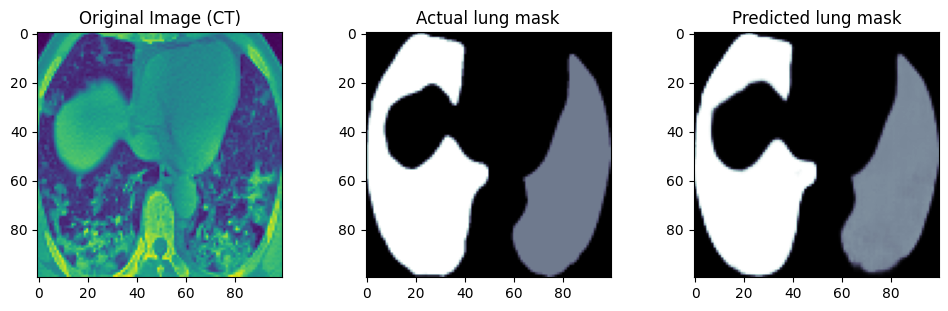

In [95]:
def compare_actual_and_predicted(img_num):

    fig = plt.figure(figsize=(12,7))
    for i in range(len(X_test)):
        plt.subplot(2,3,1)
        plt.imshow(tf.reshape(X_test[img_num], [num_pix, num_pix]))
        plt.title('Original Image (CT)')

        plt.subplot(2,3,2)
        plt.imshow(tf.reshape(yl_test[img_num], [num_pix, num_pix]), cmap='bone')
        plt.title('Actual lung mask')

    #plt.subplot(2,3,3)
    #plt.imshow(tf.reshape(yi_test[img_num], [num_pix, num_pix]), cmap='bone')
    #plt.title('infection mask')

        plt.subplot(2,3,3)
        plt.imshow(tf.reshape(yl_pred[img_num], [num_pix, num_pix]), cmap='bone')
        plt.title('Predicted lung mask')



   # plt.subplot(2,3,6)
   # plt.imshow(tf.reshape(yi_pred[img_num], [num_pix, num_pix]), cmap='bone')
    #plt.title('predicted infection mask')


compare_actual_and_predicted(165)

10/10 [==============================] - 0s 6ms/step


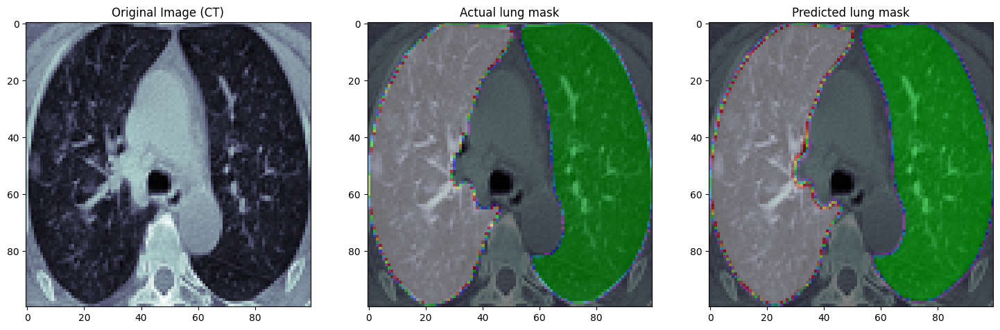

In [96]:
predicted = ctsModel.predict(X_test)
fig = plt.figure(figsize = (18,15))


for i in range(len(X_test)):
    plt.subplot(1,3,1)
    plt.imshow(X_test[i][...,0], cmap = 'bone')
    plt.title('Original Image (CT)')

    plt.subplot(1,3,2)
    plt.imshow(X_test[i][...,0], cmap = 'bone')
    plt.imshow(yl_test[i][...,0],alpha = 0.5, cmap = "nipy_spectral")
    plt.title('Actual lung mask')

    plt.subplot(1,3,3)
    plt.imshow(X_test[i][...,0], cmap = 'bone')
    plt.imshow(predicted[i][...,0],alpha = 0.5,cmap = "nipy_spectral")
    plt.title('Predicted lung mask')

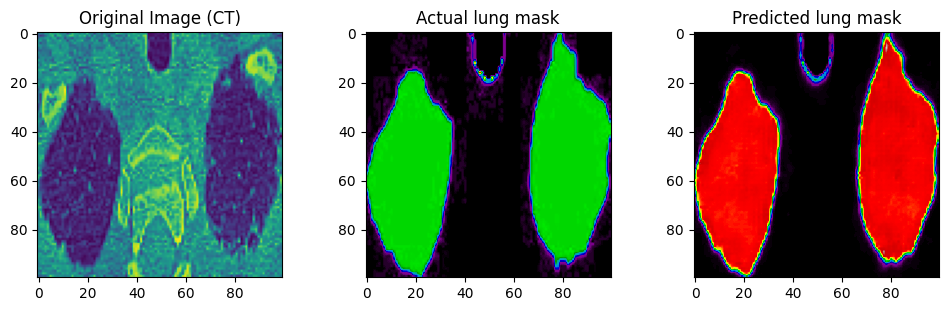

In [97]:
def compare_actual_and_predicted(img_num):

    fig = plt.figure(figsize=(12,7))

    plt.subplot(2,3,1)
    plt.imshow(tf.reshape(X_test[img_num], [num_pix, num_pix]))
    plt.title('Original Image (CT)')

    plt.subplot(2,3,2)
    plt.imshow(tf.reshape(yl_test[img_num], [num_pix, num_pix]), cmap='nipy_spectral')
    plt.title('Actual lung mask')

    #plt.subplot(2,3,3)
    #plt.imshow(tf.reshape(yi_test[img_num], [num_pix, num_pix]), cmap='bone')
    #plt.title('infection mask')

    plt.subplot(2,3,3)
    plt.imshow(tf.reshape(yl_pred[img_num], [num_pix, num_pix]), cmap='nipy_spectral')
    plt.title('Predicted lung mask')

   # plt.subplot(2,3,6)
   # plt.imshow(tf.reshape(yi_pred[img_num], [num_pix, num_pix]), cmap='bone')
    #plt.title('predicted infection mask')


compare_actual_and_predicted(40)

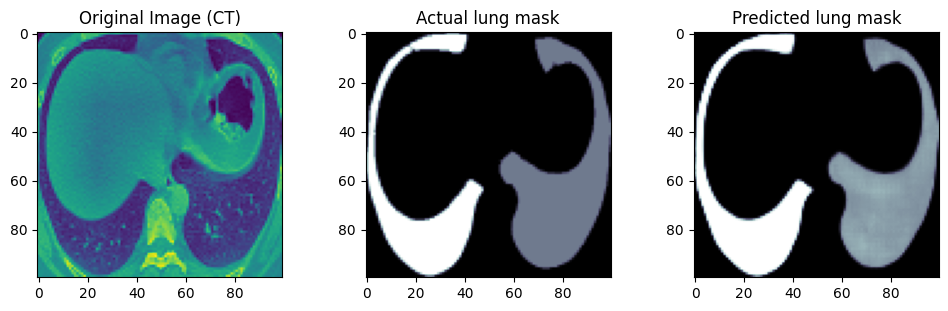

In [98]:
def compare_actual_and_predicted(img_num):

    fig = plt.figure(figsize=(12,7))

    plt.subplot(2,3,1)
    plt.imshow(tf.reshape(X_test[img_num], [num_pix, num_pix]))
    plt.title('Original Image (CT)')

    plt.subplot(2,3,2)
    plt.imshow(tf.reshape(yl_test[img_num], [num_pix, num_pix]), cmap='bone')
    plt.title('Actual lung mask')



    plt.subplot(2,3,3)
    plt.imshow(tf.reshape(yl_pred[img_num], [num_pix, num_pix]), cmap='bone')
    plt.title('Predicted lung mask')




compare_actual_and_predicted(200)

1/1 [==============================] - 0s 116ms/step


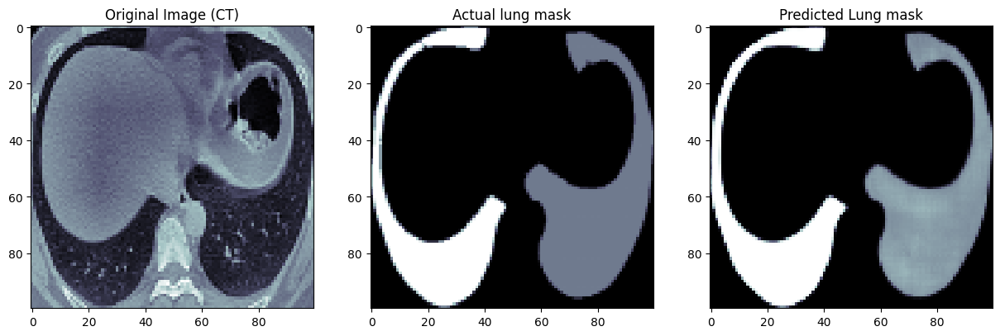

1/1 [==============================] - 0s 28ms/step


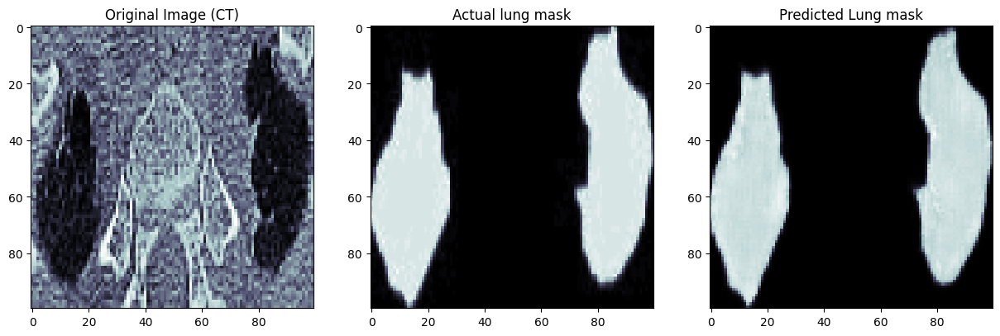

1/1 [==============================] - 0s 28ms/step


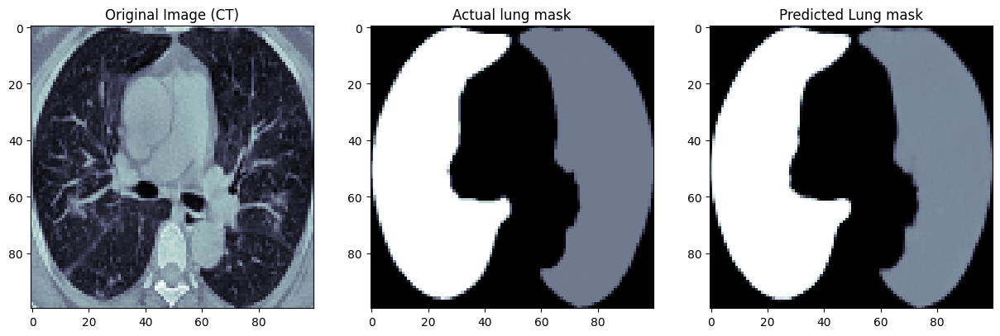

1/1 [==============================] - 0s 27ms/step


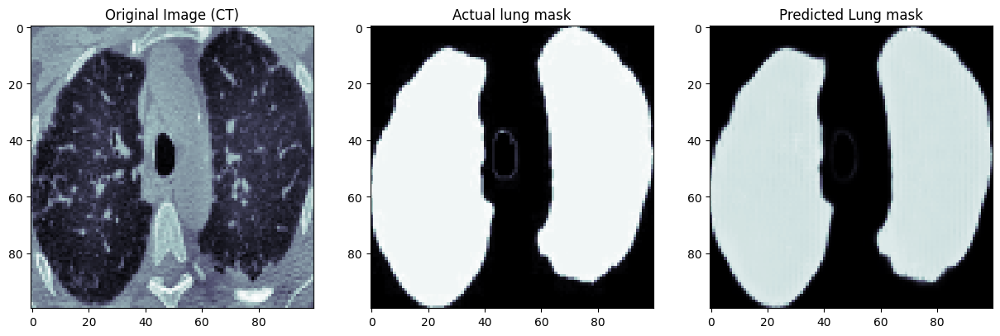

1/1 [==============================] - 0s 27ms/step


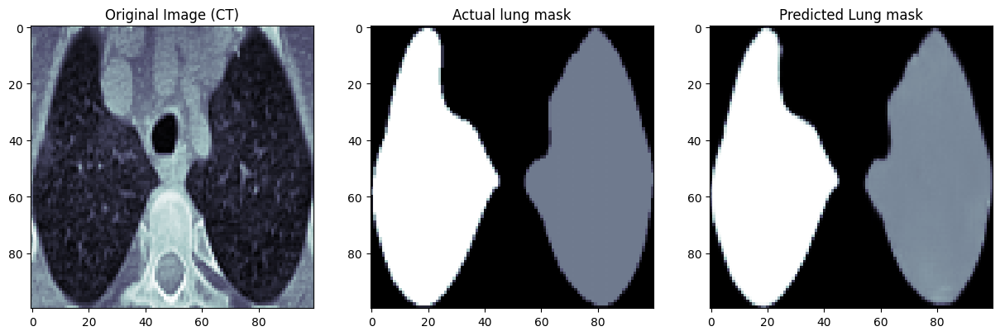

1/1 [==============================] - 0s 27ms/step


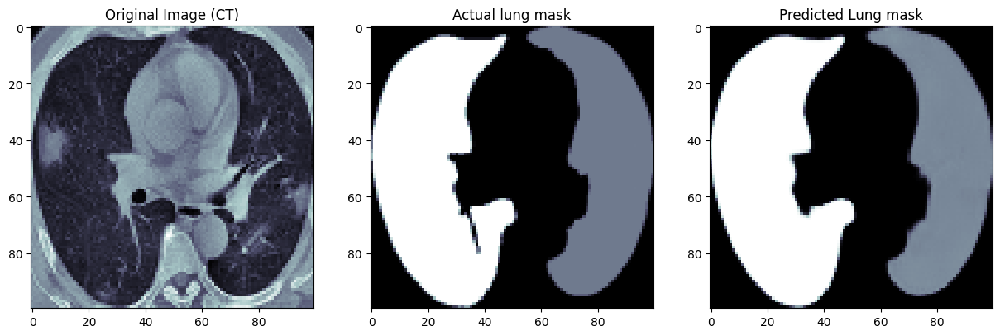

1/1 [==============================] - 0s 28ms/step


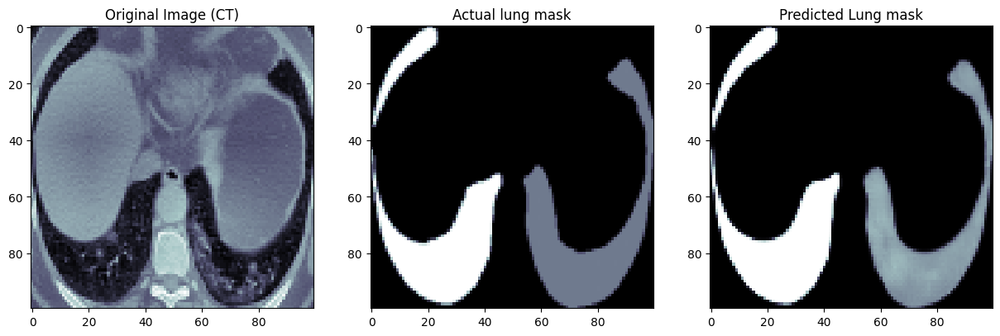

In [99]:
from tensorflow.python.ops.numpy_ops import np_config
np_config.enable_numpy_behavior()
def compare_actual_and_predicted(img_num):
    temp = ctsModel.predict(X_test[img_num].reshape(1,num_pix, num_pix,1))

    fig = plt.figure(figsize=(15,15))

    plt.subplot(1,3,1)
    plt.imshow(X_test[img_num].reshape(num_pix, num_pix), cmap='bone')
    plt.title('Original Image (CT)')

    plt.subplot(1,3,2)
    plt.imshow(yl_test[img_num].reshape(num_pix, num_pix), cmap='bone')
    plt.title('Actual lung mask')

    plt.subplot(1,3,3)
    plt.imshow(temp.reshape(num_pix, num_pix), cmap='bone')
    plt.title('Predicted Lung mask')

    plt.show()
for i in [200,269,155, 255, 80, 90,51]:
    compare_actual_and_predicted(i)

In [100]:
the_range = np.arange(0.10,0.80, 0.05)

In [101]:
%env SM_FRAMEWORK=tf.keras

env: SM_FRAMEWORK=tf.keras


In [102]:
import segmentation_models as sm

dices=[]
ious=[]

for t in the_range:
    iou = sm.metrics.IOUScore(threshold=t)
    dice = sm.metrics.FScore(threshold=t)
    ctsModel.compile(optimizer=Adam(learning_rate = 0.002), loss=bce_dice_loss, metrics=[dice, iou])
    score = ctsModel.evaluate(X_test, yl_test, batch_size=32) #X_test, yl_test
    dices.append(score[1])
    ious.append(score[2])

Segmentation Models: using `tf.keras` framework.
10/10 [==============================] - 1s 11ms/step - loss: 0.2465 - f1-score: 0.7735 - iou_score: 0.6316


In [103]:
print('DICES:',dices)
print("IOUS:",ious)
print("Best Threshold:", the_range[np.argmax(dices)])
print("Best dice score:", dices[np.argmax(dices)])
print("Best iou score:", ious[np.argmax(ious)])

DICES: [0.8074962496757507, 0.810496985912323, 0.8123589754104614, 0.8135210871696472, 0.8143056035041809, 0.8148211240768433, 0.8150947690010071, 0.8151705861091614, 0.8150089979171753, 0.7944932579994202, 0.780447244644165, 0.7774669528007507, 0.7750402092933655, 0.7735229730606079]
IOUS: [0.6777347326278687, 0.6819617748260498, 0.6845963001251221, 0.6862429976463318, 0.6873588562011719, 0.6880937814712524, 0.6884806156158447, 0.6885911226272583, 0.6883600950241089, 0.6596651077270508, 0.6407055854797363, 0.6367896199226379, 0.6336174011230469, 0.6316275000572205]
Best Threshold: 0.45000000000000007
Best dice score: 0.8151705861091614
Best iou score: 0.6885911226272583


Best Threshold: 0.45000000000000007


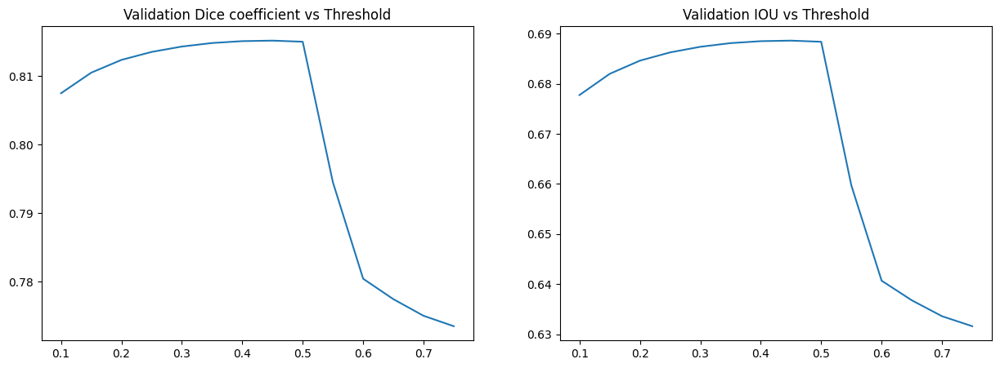

In [104]:
print("Best Threshold:", the_range[np.argmax(dices)])
fig = plt.figure(figsize=(15,5))

plt.subplot(1, 2, 1)
plt.plot(the_range, dices)
plt.title("Validation Dice coefficient vs Threshold")

plt.subplot(1, 2, 2)
plt.plot(the_range, ious)
plt.title("Validation IOU vs Threshold")

plt.show()

In [105]:
the_new_range = np.arange(0.43,0.53, 0.001)

In [106]:
new_dices=[]
new_ious=[]

for t in the_new_range:
    iou = sm.metrics.IOUScore(threshold=t)
    dice = sm.metrics.FScore(threshold=t)
    ctsModel.compile(optimizer=Adam(learning_rate=0.002), loss=bce_dice_loss, metrics=[dice, iou])
    score = ctsModel.evaluate(X_test, yl_test, batch_size=32)
    new_dices.append(score[1])
    new_ious.append(score[2])

10/10 [==============================] - 1s 12ms/step - loss: 0.2465 - f1-score: 0.8172 - iou_score: 0.6915


In [107]:
print('NEW DICES:',new_dices)
print("NEW IOUS:",new_ious)
print("New Best Threshold:", the_new_range[np.argmax(new_dices)])
print("Best new dice score:", new_dices[np.argmax(new_dices)])
print("Best new iou score:", new_ious[np.argmax(new_ious)])

NEW DICES: [0.8151626586914062, 0.8151642680168152, 0.8151659965515137, 0.8151630163192749, 0.8151666522026062, 0.8151668310165405, 0.8151676058769226, 0.8151682615280151, 0.8151686787605286, 0.8151718378067017, 0.8151693344116211, 0.8151728510856628, 0.8151724934577942, 0.8151688575744629, 0.8151692152023315, 0.8151690363883972, 0.8151682615280151, 0.815168559551239, 0.8151671290397644, 0.8151684999465942, 0.8151705861091614, 0.8151679039001465, 0.8151667714118958, 0.8151679039001465, 0.8151664733886719, 0.8151648640632629, 0.8151670694351196, 0.8151636123657227, 0.8151646852493286, 0.8151640892028809, 0.8151639699935913, 0.8151620030403137, 0.8151587247848511, 0.8151594400405884, 0.8151556253433228, 0.8151555061340332, 0.8151508569717407, 0.8151505589485168, 0.8151496648788452, 0.815143883228302, 0.8151443600654602, 0.8151412010192871, 0.8151370882987976, 0.8151410222053528, 0.8151386380195618, 0.8151321411132812, 0.815127968788147, 0.8151200413703918, 0.8151167035102844, 0.815112948

Best Threshold: 0.524


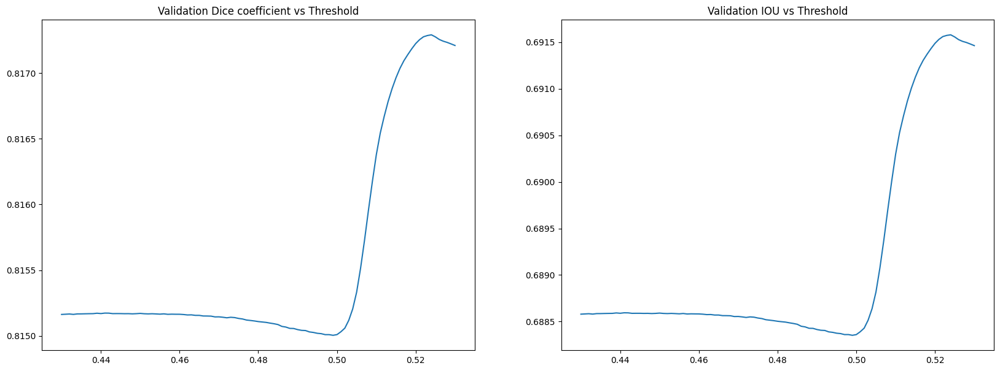

In [108]:
print("Best Threshold:", the_new_range[np.argmax(new_dices)])
fig = plt.figure(figsize=(20,7))

plt.subplot(1, 2, 1)
plt.plot(the_new_range, new_dices)
plt.title("Validation Dice coefficient vs Threshold")

plt.subplot(1, 2, 2)
plt.plot(the_new_range, new_ious)
plt.title("Validation IOU vs Threshold")

plt.show()

In [109]:
the_prec_rec_range = np.arange(0,1, 0.05)

In [110]:
precisions=[]
recalls=[]

for t in the_prec_rec_range:
    precision = sm.metrics.Precision(threshold=t)
    recall = sm.metrics.Recall(threshold=t)
    ctsModel.compile(optimizer=Adam(learning_rate=0.002), loss=bce_dice_loss, metrics=[precision, recall])
    score = ctsModel.evaluate(X_test, yl_test, batch_size=32)
    precisions.append(score[1])
    recalls.append(score[2])

10/10 [==============================] - 1s 12ms/step - loss: 0.2465 - precision: 0.9872 - recall: 0.6114


In [111]:
print('PRECISIONS:',precisions)
print("RRECALLS:",recalls)
print("Best Threshold for Precision:", the_prec_rec_range[np.argmax(precisions)])
print("Best Threshold for Recall:", the_prec_rec_range[np.argmax(recalls)])
print("Best precision score:", precisions[np.argmax(precisions)])
print("Best recall score:", recalls[np.argmax(recalls)])

PRECISIONS: [0.3552270829677582, 0.6743875741958618, 0.6835657954216003, 0.6895285844802856, 0.6937655210494995, 0.6969096660614014, 0.6995645761489868, 0.7019832730293274, 0.7042349576950073, 0.7065253853797913, 0.7093263864517212, 0.8449134826660156, 0.9291820526123047, 0.9506557583808899, 0.966533362865448, 0.9728501439094543, 0.9758309125900269, 0.9781025052070618, 0.9822333455085754, 0.9872196316719055]
RRECALLS: [1.0, 0.9911952018737793, 0.9876648187637329, 0.9842690229415894, 0.9811576008796692, 0.9782674908638, 0.9753153920173645, 0.9721087217330933, 0.9685782194137573, 0.9644613265991211, 0.9587945938110352, 0.7507451772689819, 0.6731600165367126, 0.6581696271896362, 0.647663414478302, 0.6428890824317932, 0.6393689513206482, 0.6356276273727417, 0.6253518462181091, 0.6113536953926086]
Best Threshold for Precision: 0.9500000000000001
Best Threshold for Recall: 0.0
Best precision score: 0.9872196316719055
Best recall score: 1.0


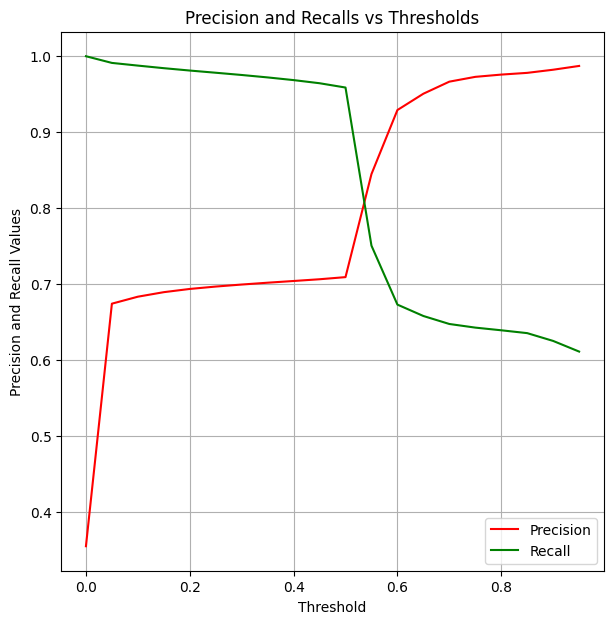

In [112]:
from pylab import rcParams

rcParams['figure.figsize'] = 7,7
plt.rcParams["axes.grid"] = True
plt.title("Precision and Recalls vs Thresholds")
plt.xlabel('Threshold')
plt.ylabel('Precision and Recall Values')
plt.plot(the_prec_rec_range,precisions, color='red')
plt.plot(the_prec_rec_range, recalls, color='green')
plt.legend(['Precision', 'Recall'])

# Test dataset

In [139]:
url = 'https://drive.google.com/file/d/17mnGpdOheOHd0XxydY6ghQVdXp8Vx94c/view?usp=share_link'
output_path = 'moscow_med_test_data.zip'
gdown.download(url, output_path, quiet=False, fuzzy=True)

Downloading...
From: https://drive.google.com/uc?id=17mnGpdOheOHd0XxydY6ghQVdXp8Vx94c
To: /home/rparchiev/moscow_med_test_data.zip
100%|██████████████████████████████████████| 80.0M/80.0M [00:01<00:00, 59.8MB/s]


'moscow_med_test_data.zip'

In [140]:
!unzip moscow_med_test_data.zip -d Moscow_Medicine_data

!rm -r moscow_med_test_data.zip

clear_output()

In [113]:
from PIL import Image, ImageFilter
import os
import cv2
import numpy as np

In [114]:
# PATH_TO_TEST_DATA = '/content/Moscow_Medicine_data/'

# for i in os.listdir(PATH_TO_TEST_DATA):
#     im = Image.open(PATH_TO_TEST_DATA + i)
#     im = im.rotate(17, expand=False, fillcolor='black')
#     im = im.resize((512, 512), Image.LANCZOS)

#     # Add sharpening with radius=2 and amount=150
#     im = im.filter(ImageFilter.UnsharpMask(radius=2, percent=150))

#     # Add detail enhancement with radius=1, threshold=10, and factor=2
#     detail = im.filter(ImageFilter.UnsharpMask(radius=1, threshold=10))
#     im = Image.blend(im, detail, 0.5)

#     im.save(PATH_TO_TEST_DATA + i, quality=100)
#     im.close();

In [115]:
import os
from PIL import Image, ImageFilter, ImageChops

PATH_TO_TEST_DATA = 'Moscow_Medicine_data/'

kernel_size = 10

for i in os.listdir(PATH_TO_TEST_DATA):
    im = Image.open(PATH_TO_TEST_DATA + i)
    im = im.rotate(17, expand=False, fillcolor='black')
    im = im.resize((512, 512), Image.LANCZOS)

    # Add sharpening with radius=2 and amount=150
    im = im.filter(ImageFilter.UnsharpMask(radius=2, percent=150))

    # Add detail enhancement with radius=1, threshold=10, and factor=2
    detail = im.filter(ImageFilter.UnsharpMask(radius=3, threshold=10))
    im = Image.blend(im, detail, 0.5)

    # Convert image to grayscale and create a binary mask
    gray = im.convert('L')
    mask = gray.point(lambda x: 255 if x > 100 else 0, mode='1')

    # Convert the mask to the same mode as the original image
    mask = mask.convert(im.mode)

    # Apply Gaussian blur to the mask image to create a smooth edge
    mask = mask.filter(ImageFilter.GaussianBlur(radius=kernel_size))

    # Combine the smoothed edges with the original image
    im_edges = ImageChops.multiply(im, mask)
    im_smoothed = ImageChops.multiply(im, ImageChops.invert(mask))
    im_smoothed = im_smoothed.filter(ImageFilter.GaussianBlur(radius=kernel_size))

    # Combine the smoothed edges with the original image
    im_final = ImageChops.add(im_edges, im_smoothed)

    im_final.save(PATH_TO_TEST_DATA + i, quality=100)
    im_final.close()


In [116]:
import random
import matplotlib.pyplot as plt

random.seed(0) # set seed for reproducibility

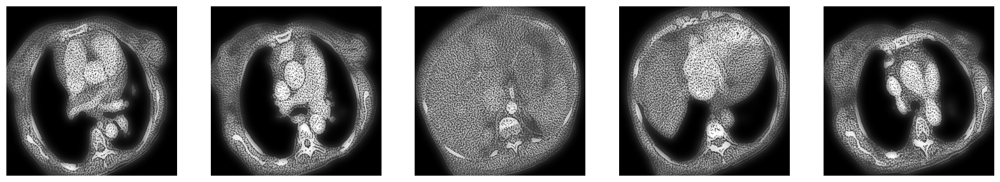

In [117]:
# Get a list of the processed images
images = [Image.open(os.path.join(PATH_TO_TEST_DATA, i)) for i in os.listdir(PATH_TO_TEST_DATA)]

# Choose 5 random images to plot
random_images = random.sample(images, 5)

# Plot the images using matplotlib
fig, axes = plt.subplots(1, 5, figsize=(20, 5))

for i, im in enumerate(random_images):
    axes[i].imshow(im, cmap='gray')
    axes[i].axis('off')

plt.show()

# Processing like Unet model 4

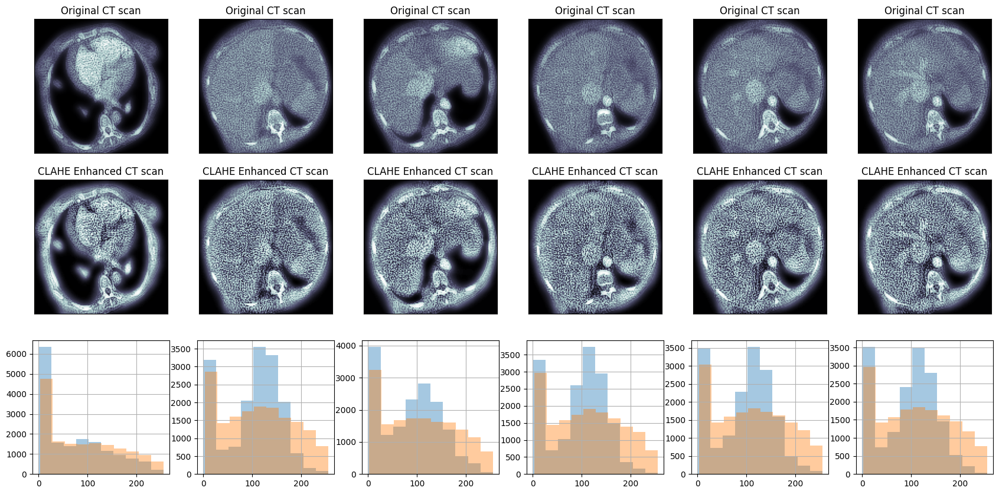

In [118]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt

img_dir = "Moscow_Medicine_data/"
img_files = [f for f in os.listdir(img_dir) if f.endswith('.png')]
img_size = 128

clahe = cv2.createCLAHE(clipLimit=3.0)

def clahe_enhancer(img, clahe, axes):
    '''Contract Limited Adaptive Histogram Equalizer'''
    img = np.uint8(img*255)  
    clahe_img = clahe.apply(img)

    if len(axes) > 0 :    
        axes[0].imshow(img, cmap='bone')
        axes[0].set_title("Original CT scan")
        axes[0].set_xticks([]); axes[0].set_yticks([])

        axes[1].imshow(clahe_img, cmap='bone')
        axes[1].set_title("CLAHE Enhanced CT scan")
        axes[1].set_xticks([]); axes[1].set_yticks([])

        if len(axes) > 2 :
            axes[2].hist(img.flatten(), alpha=0.4, label='Original CT scan')
            axes[2].hist(clahe_img.flatten(), alpha=0.4, label="CLAHE Enhanced CT scan")
        
    return(clahe_img)

fig, axes = plt.subplots(3, 6, figsize=(21,10))    

ii = 0
for img_file in img_files[::-1]:
    # Load the image
    img = cv2.imread(os.path.join(img_dir, img_file), cv2.IMREAD_GRAYSCALE)

    # Resize the image
    img = cv2.resize(img, dsize=(img_size, img_size), interpolation=cv2.INTER_AREA)

    # Normalize the pixel values
    xmax, xmin = img.max(), img.min()
    img = (img - xmin)/(xmax - xmin)

    # Apply CLAHE
    clahe_img = clahe_enhancer(img, clahe, list(axes[:, ii]))
    
    
    ii += 1
    if ii >= 6:
        break

In [119]:
def get_contours(img):
    img = np.uint8(img*255)
    
    kernel = np.ones((3,3),np.float32)/9
    img = cv2.filter2D(img, -1, kernel)
    
    ret, thresh = cv2.threshold(img, 50, 255, cv2.THRESH_BINARY)
    contours, hierarchy = cv2.findContours(thresh, 2, 1)
    #Areas = [cv2.contourArea(cc) for cc in contours]; print(Areas)
    
    # filter contours that are too large or small
    size = get_size(img)
    contours = [cc for cc in contours if contourOK(cc, size)]
    return contours

def get_size(img):
    ih, iw = img.shape
    return iw * ih

def contourOK(cc, size):
    x, y, w, h = cv2.boundingRect(cc)
    if ((w < 50 and h > 150) or (w > 150 and h < 50)) : 
        return False # too narrow or wide is bad
    area = cv2.contourArea(cc)
    return area < (size * 0.5) and area > 200

def find_boundaries(img, contours):
    # margin is the minimum distance from the edges of the image, as a fraction
    ih, iw = img.shape
    minx = iw
    miny = ih
    maxx = 0
    maxy = 0

    for cc in contours:
        x, y, w, h = cv2.boundingRect(cc)
        if x < minx: minx = x
        if y < miny: miny = y
        if x + w > maxx: maxx = x + w
        if y + h > maxy: maxy = y + h

    return (minx, miny, maxx, maxy)

def crop_(img, boundaries):
    minx, miny, maxx, maxy = boundaries
    return img[miny:maxy, minx:maxx]

    if len(axes) > 0 :
        axes[0].imshow(img, cmap='bone')
        axes[0].set_title("Original CT scan")
        axes[0].set_xticks([]); axes[0].set_yticks([])
        
        axes[1].imshow(cropped_img, cmap='bone')
        axes[1].set_title("Cropped CT scan")
        axes[1].set_xticks([]); axes[1].set_yticks([])
        
    return cropped_img, bounds


def crop_img(img, axes) :
    contours = get_contours(img)
    bounds = find_boundaries(img, contours)
    cropped_img = crop_(img, bounds)

    if len(axes) > 0 :
        axes[0].imshow(img, cmap='bone')
        axes[0].set_title("Original CT scan")
        axes[0].set_xticks([]); axes[0].set_yticks([])
        
        axes[1].imshow(cropped_img, cmap='bone')
        axes[1].set_title("Cropped CT scan")
        axes[1].set_xticks([]); axes[1].set_yticks([])
        
    return cropped_img, bounds

image00155.png
image00031.png
image00526.png
image00442.png
image00409.png
image00584.png
image00628.png
image00093.png
image00210.png
image00374.png
image00619.png
image00345.png
image00221.png
image00283.png
image00164.png
image00438.png
image00473.png
image00517.png
image00327.png
image00243.png
image00208.png
image00630.png
image00411.png
image00575.png
image00029.png
image00385.png
image00062.png
image00106.png
image00544.png
image00420.png
image00137.png
image00053.png
image00018.png
image00239.png
image00195.png
image00272.png
image00316.png
image00482.png
image00601.png
image00189.png
image00341.png
image00225.png
image00004.png
image00160.png
image00287.png
image00477.png
image00513.png
image00558.png
image00399.png
image00151.png
image00035.png
image00569.png
image00522.png
image00446.png
image00580.png
image00214.png
image00370.png
image00097.png
image00540.png
image00424.png
image00178.png
image00133.png
image00057.png
image00276.png
image00312.png
image00359.png
image00191

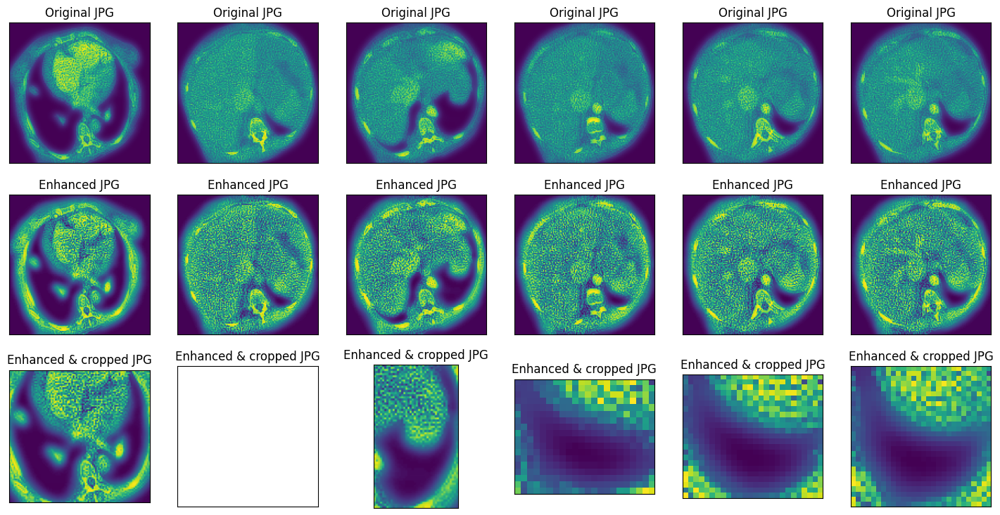

In [120]:
img_dir = "Moscow_Medicine_data"
img_files = [f for f in os.listdir(img_dir) if f.endswith('.png')]
img_size = 128
cts_all = []

fig, axes = plt.subplots(3, 6, figsize=(18, 9))

ii = 0
for img_file in img_files[::-1]:
    print(img_file)
    # Load the image
    img = cv2.imread(os.path.join(img_dir, img_file), cv2.IMREAD_GRAYSCALE)    

    resized_img = cv2.resize(img, dsize=(img_size, img_size), interpolation=cv2.INTER_AREA)
    xmax, xmin = resized_img.max(), resized_img.min()
    normalized_img = (resized_img - xmin) / (xmax - xmin)
    _, bounds = crop_img(normalized_img, [])

    if ii < 6:
        axes[0, ii].imshow(np.uint8(normalized_img*255))
        axes[0, ii].set_title('Original JPG')
        axes[0, ii].set_xticks([]); axes[0, ii].set_yticks([])

    clahe_img = clahe_enhancer(normalized_img, clahe, [])
    if ii < 6:
        axes[1, ii].imshow(clahe_img)
        axes[1, ii].set_title('Enhanced JPG')
        axes[1, ii].set_xticks([]); axes[1, ii].set_yticks([])

    cropped_img = crop_(clahe_img, bounds)
    if ii < 6:
        axes[2, ii].imshow(cropped_img)
        axes[2, ii].set_title('Enhanced & cropped JPG')
        axes[2, ii].set_xticks([]); axes[2, ii].set_yticks([])

    ii += 1
    cts_all.append(cropped_img)

In [121]:
print(len(cts_all))

638


In [122]:
num_pix = 100
del_lst = []
for ii in tqdm.tqdm(range(len(cts_all))) :
    try :
        cts_all[ii] = cv.resize(cts_all[ii], dsize=(num_pix, num_pix), interpolation=cv.INTER_AREA)
        cts_all[ii] = np.reshape(cts_all[ii], (num_pix, num_pix, 1))
    except :
        del_lst.append(ii)

for idx in del_lst[::-1] :
    del cts_all[idx]

100%|██████████████████████████████████████| 638/638 [00:00<00:00, 38007.10it/s]


посмотреть что такое x test

1/1 [==============================] - 0s 388ms/step


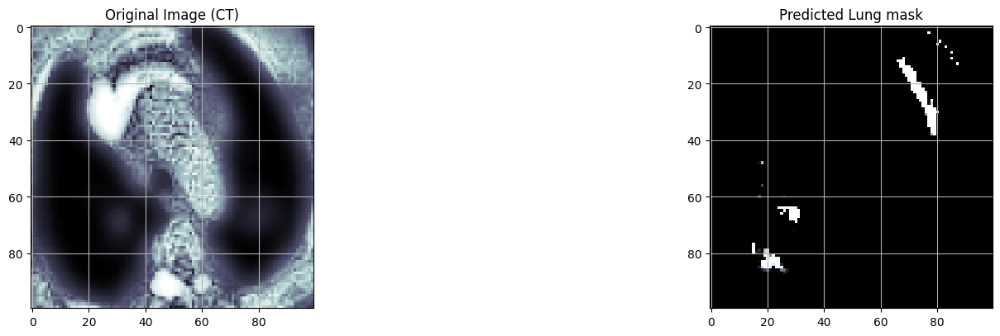

1/1 [==============================] - 0s 40ms/step


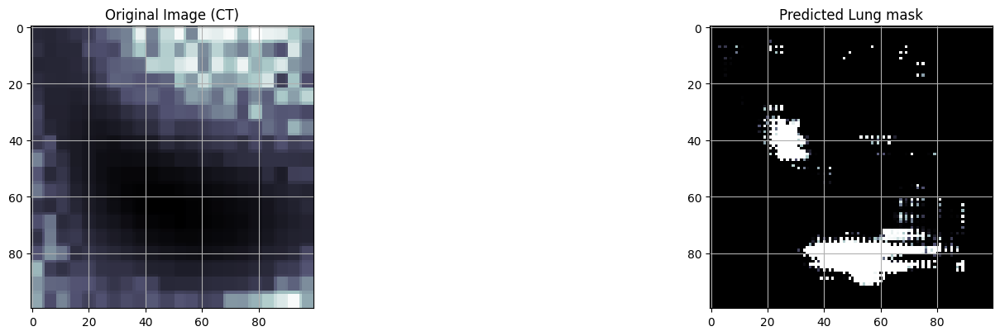

1/1 [==============================] - 0s 38ms/step


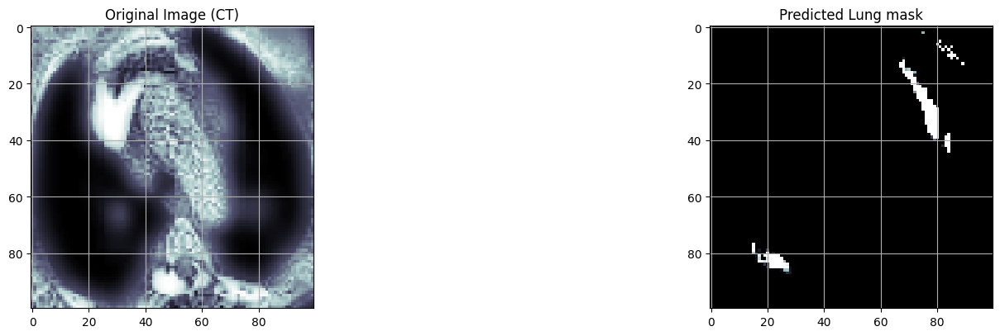

1/1 [==============================] - 0s 37ms/step


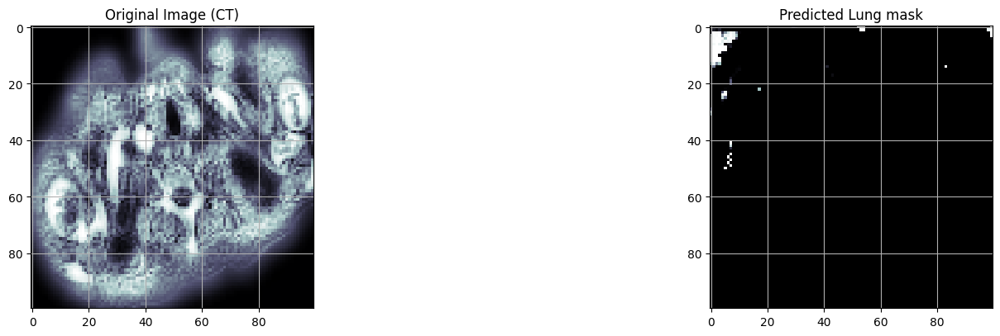

1/1 [==============================] - 0s 37ms/step


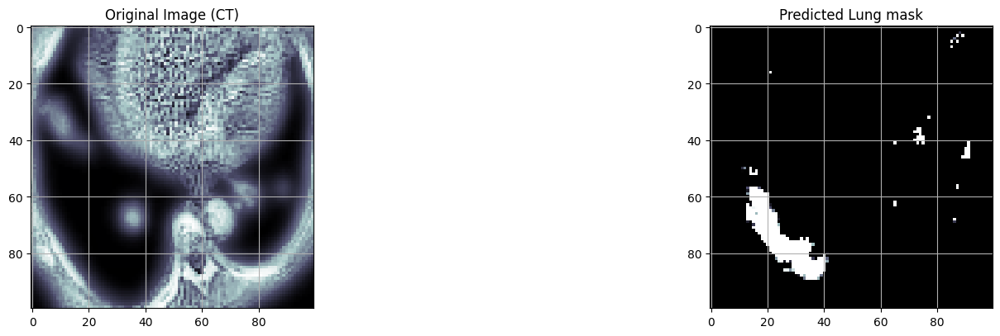

1/1 [==============================] - 0s 38ms/step


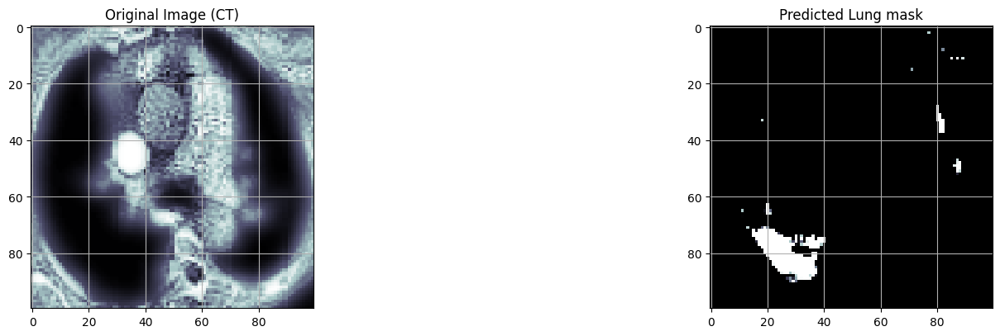

1/1 [==============================] - 0s 37ms/step


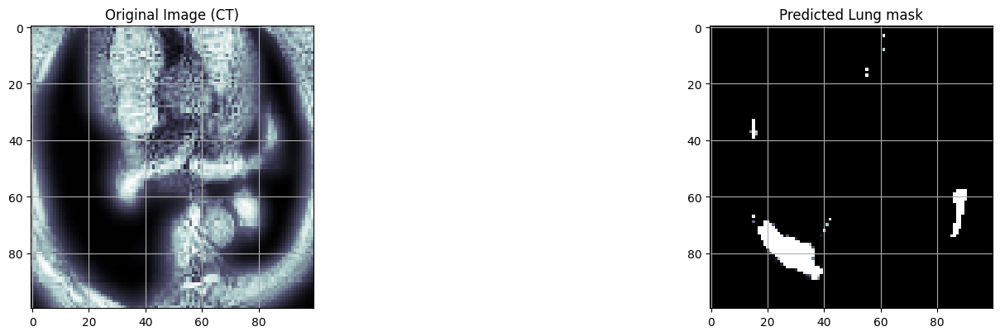

1/1 [==============================] - 0s 37ms/step


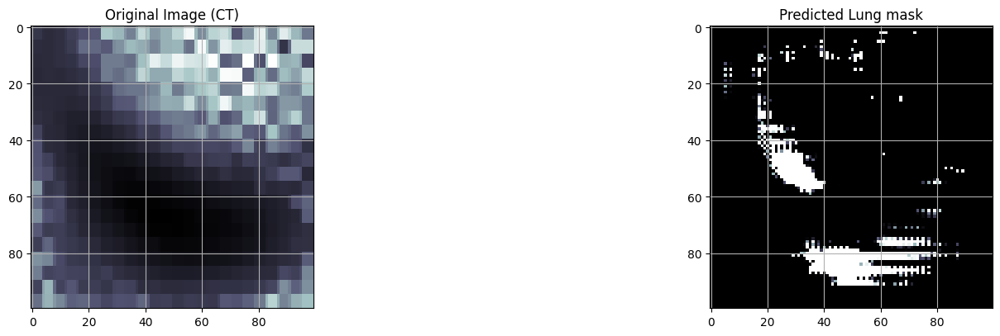

1/1 [==============================] - 0s 38ms/step


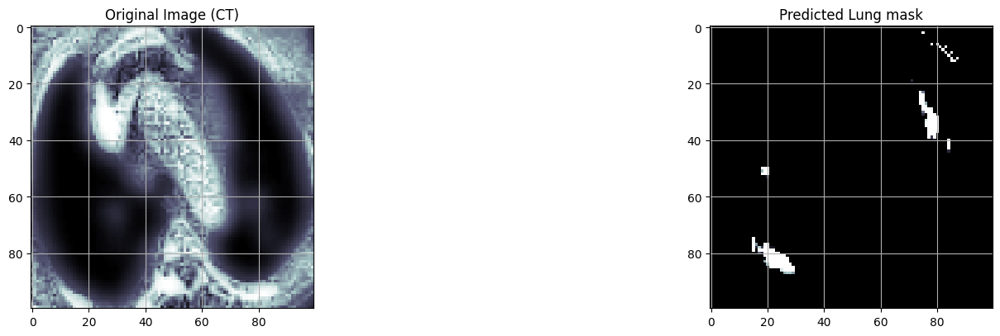

1/1 [==============================] - 0s 29ms/step


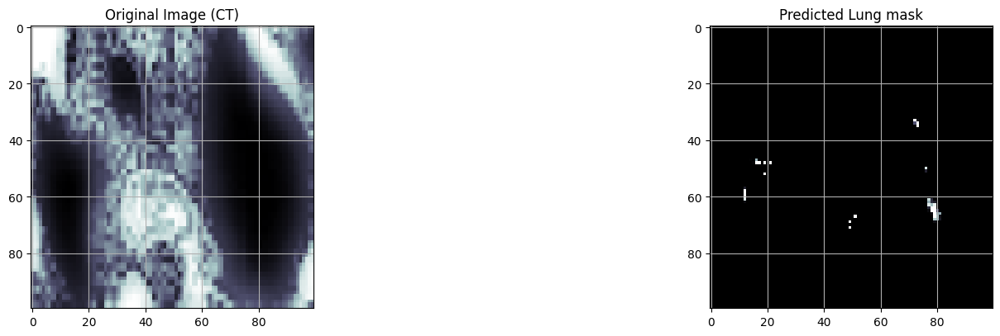

In [123]:
from tensorflow.python.ops.numpy_ops import np_config


np_config.enable_numpy_behavior()
def compare_actual_and_predicted(img_num):
    temp = ctsModel.predict(cts_all[img_num].reshape(1,num_pix, num_pix,1))

    fig = plt.figure(figsize=(15,15))

    plt.subplot(1,3,1)
    plt.imshow(cts_all[img_num].reshape(num_pix, num_pix), cmap='bone')
    plt.title('Original Image (CT)')

    # plt.subplot(1,3,2)
    # plt.imshow(yl_test[img_num].reshape(num_pix, num_pix), cmap='bone')
    # plt.title('Actual lung mask')

    plt.subplot(1,3,3)
    plt.imshow(temp.reshape(num_pix, num_pix), cmap='bone')
    plt.title('Predicted Lung mask')

    plt.show()


for i in [200,269,155, 255, 80, 90,51, 100, 130, 300]:
    compare_actual_and_predicted(i)

1/1 [==============================] - 0s 31ms/step


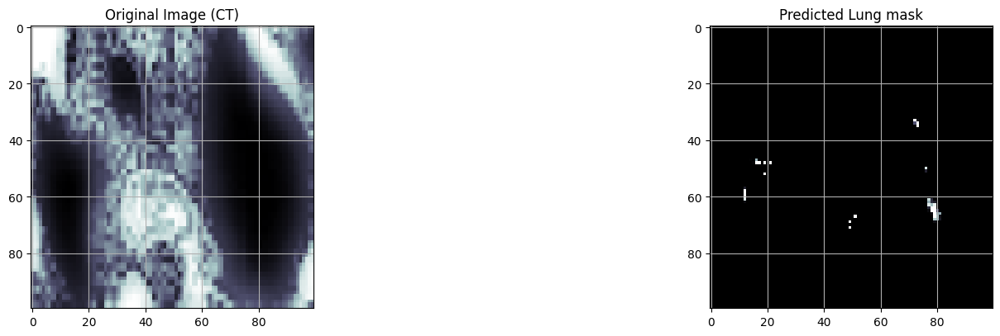

1/1 [==============================] - 0s 27ms/step


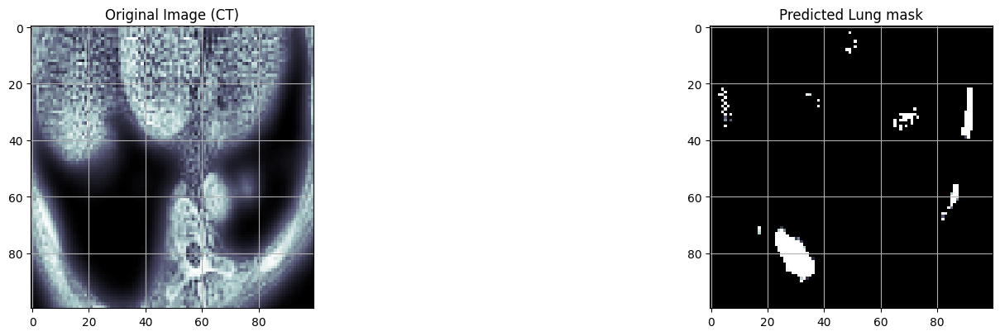

1/1 [==============================] - 0s 27ms/step


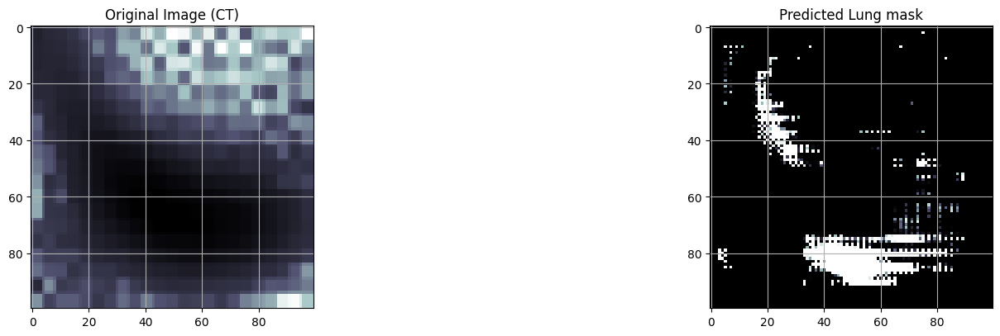

1/1 [==============================] - 0s 27ms/step


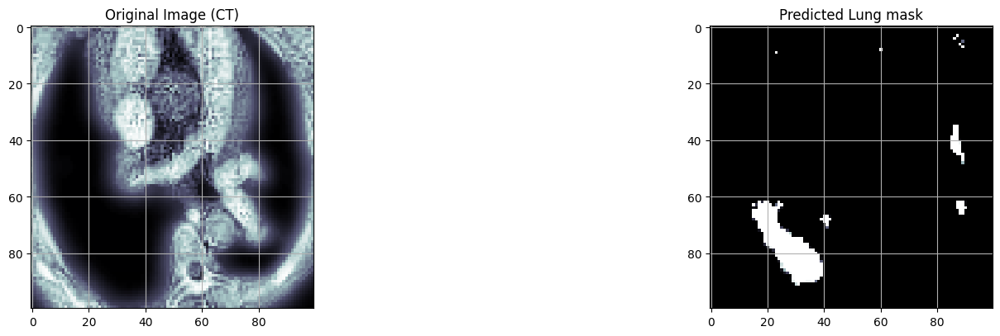

1/1 [==============================] - 0s 27ms/step


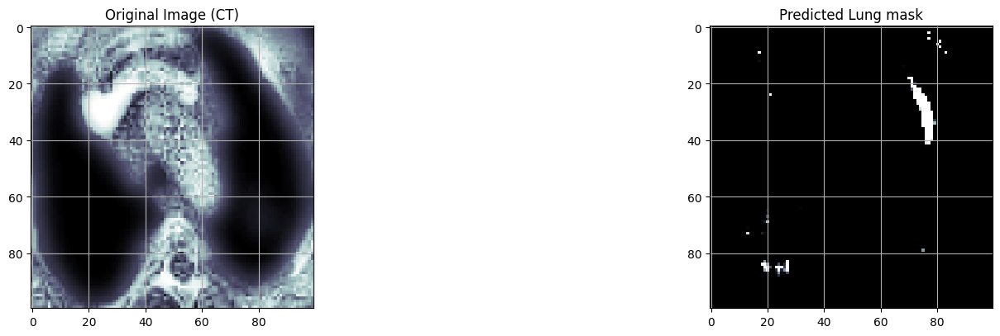

1/1 [==============================] - 0s 27ms/step


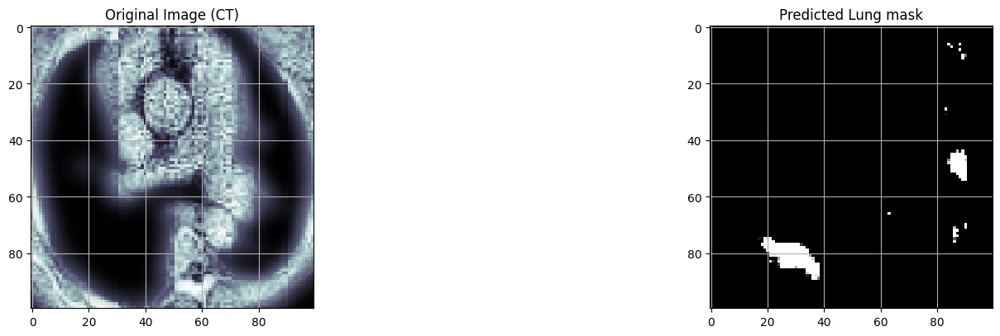

1/1 [==============================] - 0s 27ms/step


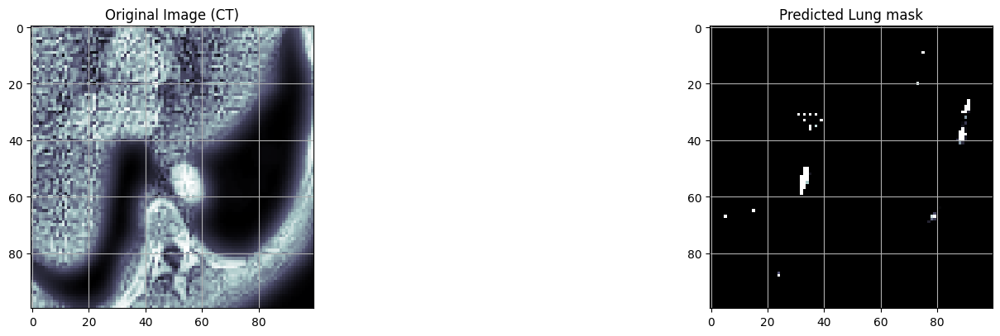

1/1 [==============================] - 0s 27ms/step


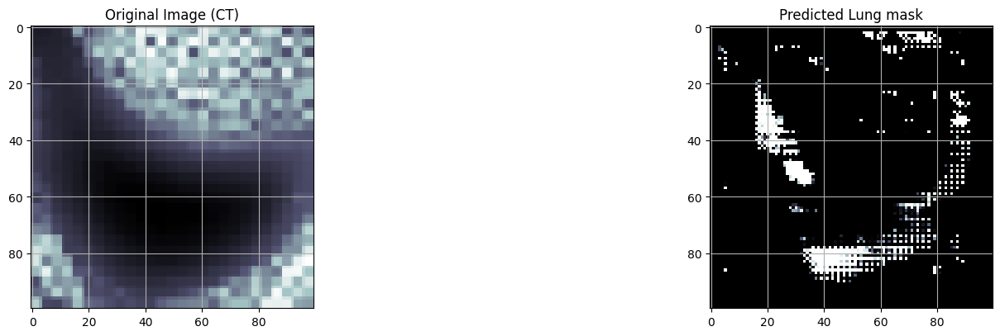

1/1 [==============================] - 0s 27ms/step


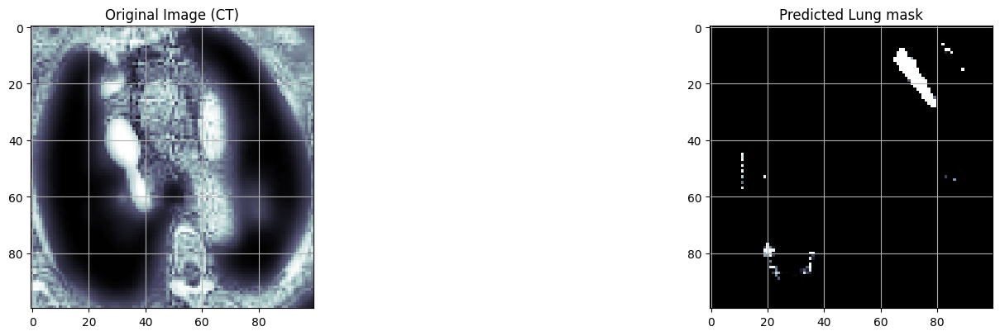

1/1 [==============================] - 0s 27ms/step


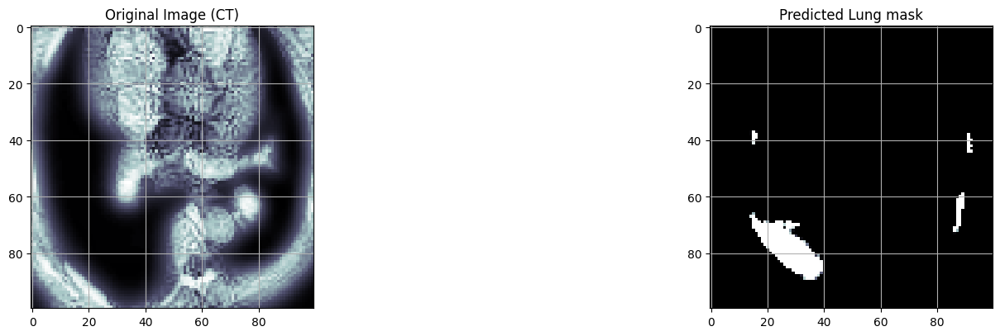

1/1 [==============================] - 0s 27ms/step


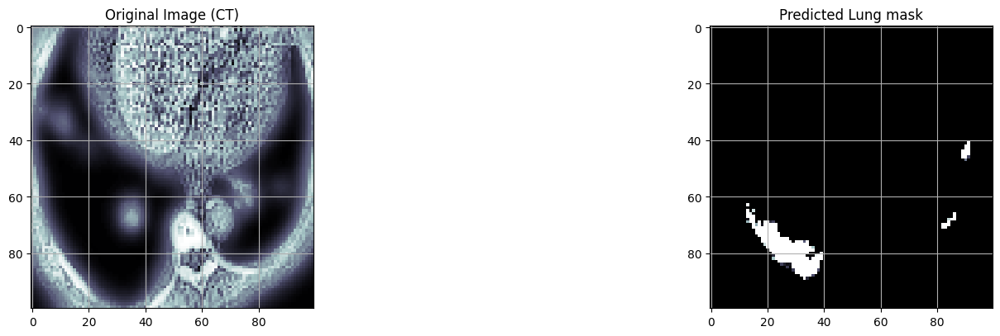

1/1 [==============================] - 0s 27ms/step


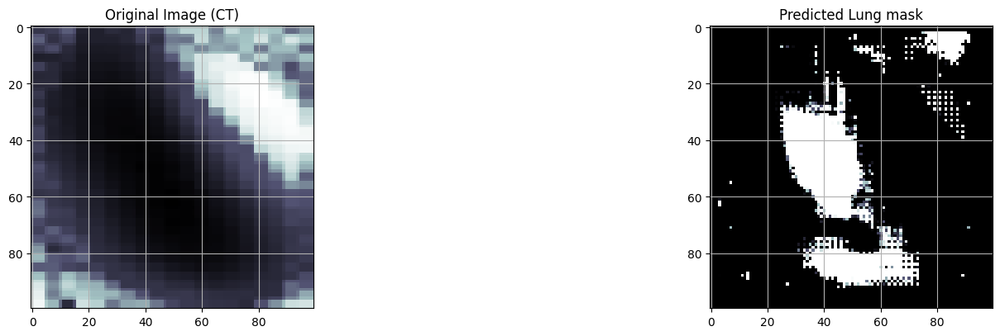

1/1 [==============================] - 0s 27ms/step


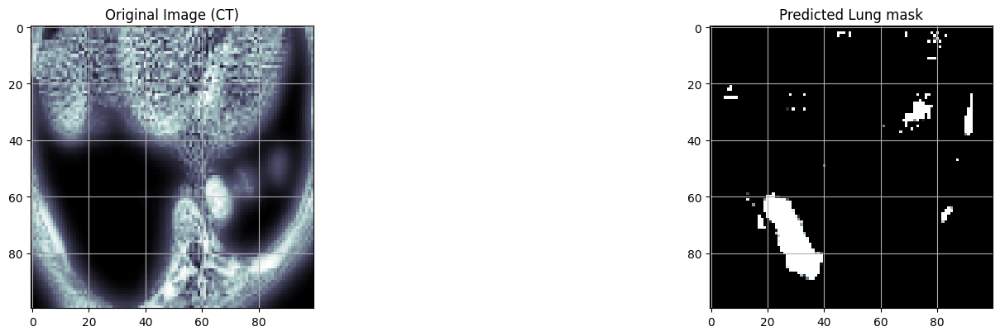

1/1 [==============================] - 0s 28ms/step


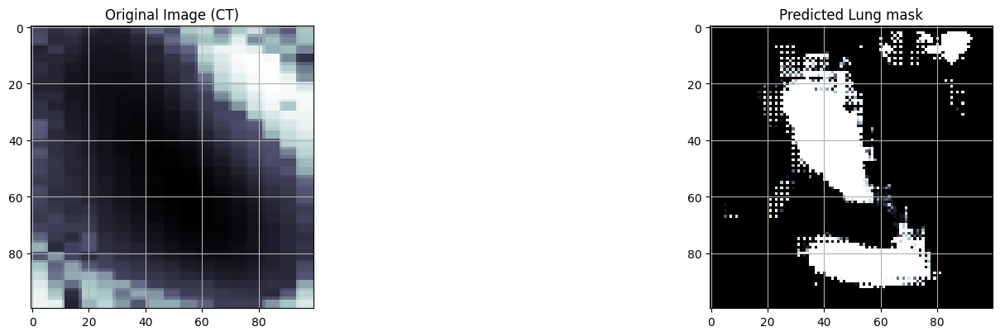

1/1 [==============================] - 0s 27ms/step


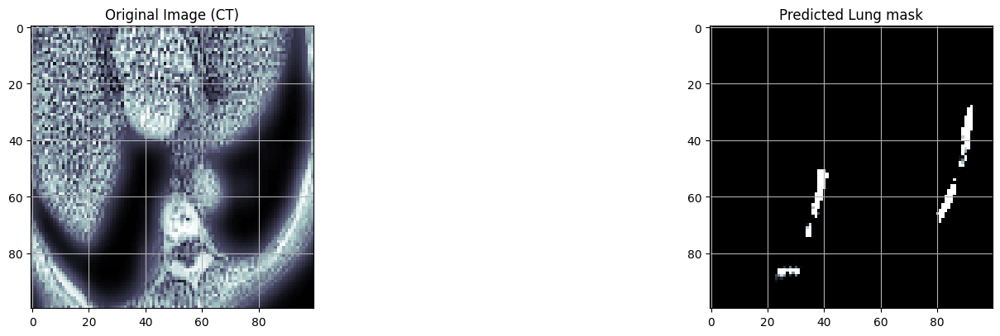

1/1 [==============================] - 0s 26ms/step


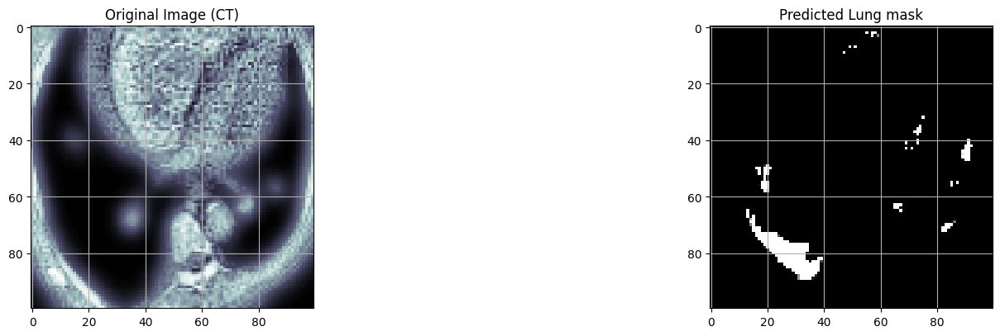

1/1 [==============================] - 0s 27ms/step


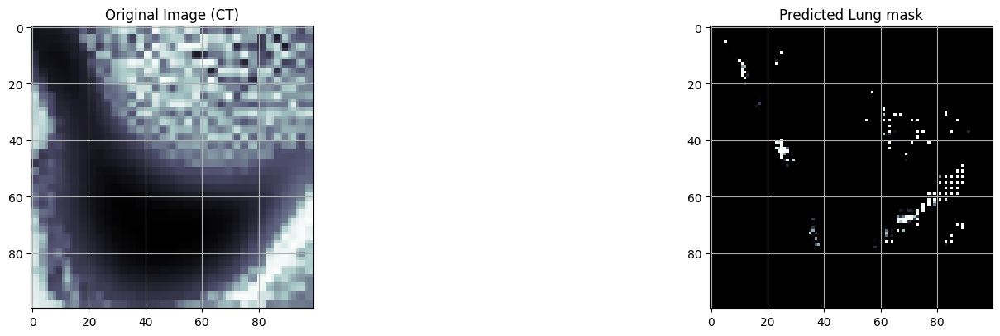

1/1 [==============================] - 0s 26ms/step


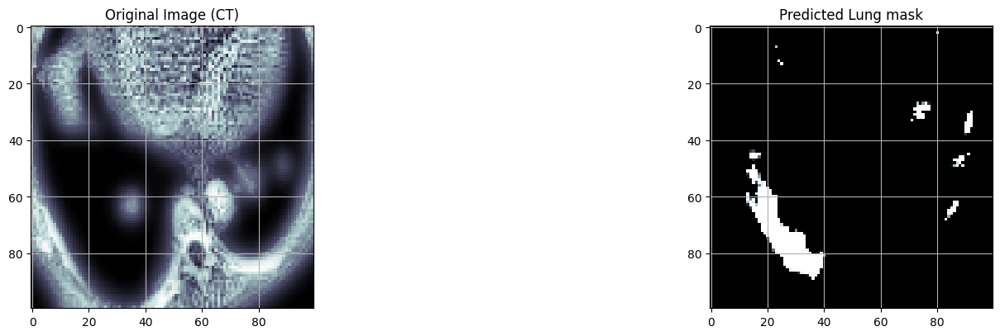

1/1 [==============================] - 0s 26ms/step


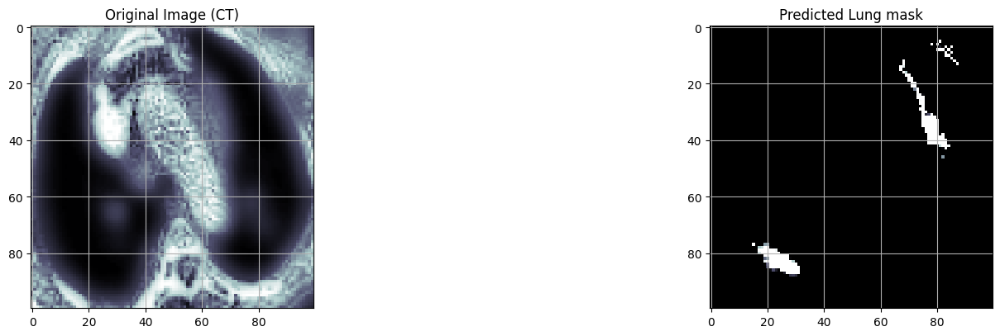

1/1 [==============================] - 0s 30ms/step


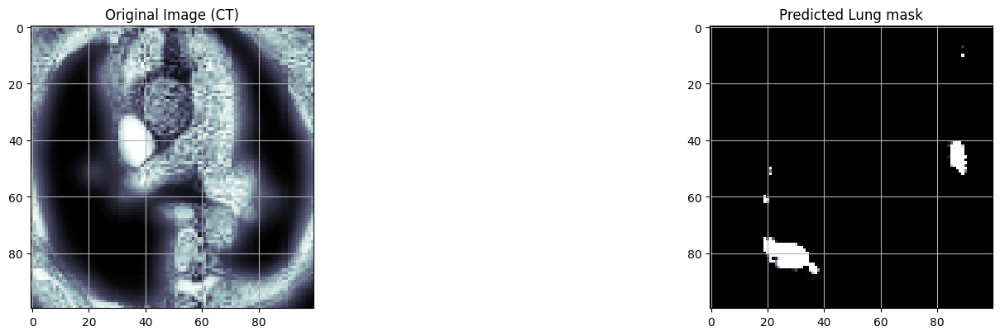

In [124]:
for i in range(300, 320):
    compare_actual_and_predicted(i)